<a href="https://colab.research.google.com/github/shubhamksingh1/GANs/blob/main/Jupyter_Notebooks/CycleGAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  CycleGAN
This Colab / Ipython notebook will walk you through: 
1. Install extra dependencies that Colab does not natively support
2. Download the apple2orange dataset using the `%%bash` magic.
3. Create the `DataLoader()` class that server as our core data structure
4. Do all the necessary imports
5. Define the CycleGAN in the following steps:

> 5.1 Define the key hyper-parameters and flow

> 5.2 Define the static methods we are going to be reusing in the generator and discriminator

> 5.3 Build the generator and the discriminator

> 5.4 Define the helper function for sampling our translated images

> 5.5 Define the explicit training loop

6. Fit the CycleGAN and talk about the results!


--- 

## Helper functions 
1. Pip installing directly from GitHub the `keras-contrib` folder, which we will need for the `InstanceNormalization`. We tested this git-hash version of the repository: 
`46fcdb9384b3bc9399c651b2b43640aa54098e64`
2. Downloading the dataset to our cloud-based—ephemeral—storage

In [ ]:
%tensorflow_version 1.x

TensorFlow 1.x selected.


In [ ]:
import tensorflow
print(tensorflow.__version__)

1.15.2


In [ ]:
!pip install scipy==1.2.2

In [ ]:
#@title
!pip install git+https://www.github.com/keras-team/keras-contrib.git

  Cloning https://www.github.com/keras-team/keras-contrib.git to /tmp/pip-req-build-_9txr3nb
  Running command git clone -q https://www.github.com/keras-team/keras-contrib.git /tmp/pip-req-build-_9txr3nb
  Created wheel for keras-contrib: filename=keras_contrib-2.0.8-py3-none-any.whl size=101077 sha256=63251628c31a4205ec624883d4a3d24a618eff72818a44ebfce13e8dd597d1b5
  Stored in directory: /tmp/pip-ephem-wheel-cache-3xphi3k4/wheels/bb/1f/f2/b57495012683b6b20bbae94a3915ec79753111452d79886abc
Successfully built keras-contrib


In [ ]:
from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization

Using TensorFlow backend.


In [ ]:
#@title
%%bash

FILE=apple2orange

URL=https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/$FILE.zip
mkdir ./datasets
ZIP_FILE=./datasets/$FILE.zip
TARGET_DIR=./datasets/$FILE/
wget -N $URL -O $ZIP_FILE
mkdir $TARGET_DIR
unzip $ZIP_FILE -d ./datasets/
rm $ZIP_FILE


Archive:  ./datasets/apple2orange.zip
   creating: ./datasets/apple2orange/trainA/
  inflating: ./datasets/apple2orange/trainA/n07740461_6908.jpg  
  inflating: ./datasets/apple2orange/trainA/n07740461_7635.jpg  
  inflating: ./datasets/apple2orange/trainA/n07740461_586.jpg  
  inflating: ./datasets/apple2orange/trainA/n07740461_9813.jpg  
  inflating: ./datasets/apple2orange/trainA/n07740461_6835.jpg  
  inflating: ./datasets/apple2orange/trainA/n07740461_2818.jpg  
  inflating: ./datasets/apple2orange/trainA/n07740461_2918.jpg  
  inflating: ./datasets/apple2orange/trainA/n07740461_1213.jpg  
  inflating: ./datasets/apple2orange/trainA/n07740461_2476.jpg  
  inflating: ./datasets/apple2orange/trainA/n07740461_13596.jpg  
  inflating: ./datasets/apple2orange/trainA/n07740461_4093.jpg  
  inflating: ./datasets/apple2orange/trainA/n07740461_14738.jpg  
  inflating: ./datasets/apple2orange/trainA/n07740461_6477.jpg  
  inflating: ./datasets/apple2orange/trainA/n07740461_11356.jpg  
  inf

for details.

--2022-04-08 10:59:22--  https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/apple2orange.zip
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.244.190
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 78456409 (75M) [application/zip]
Saving to: ‘./datasets/apple2orange.zip’

     0K .......... .......... .......... .......... ..........  0%  337K 3m47s
    50K .......... .......... .......... .......... ..........  0%  172K 5m36s
   100K .......... .......... .......... .......... ..........  0% 27.8M 3m45s
   150K .......... .......... .......... .......... ..........  0% 30.2M 2m49s
   200K .......... .......... .......... .......... ..........  0%  347K 2m59s
   250K .......... .......... .......... .......... ..........  0% 43.4M 2m30s
   300K .......... .......... .......... .......... ..........  0% 48.9M 2m8s
   350K .........

## DataLoader
We define our key data-holding object in the (hidden) cell below. With it, we can:
1. `load_data` from disk based on the dataset name, which we will define in `CycleGAN`'s `__init__`
2. `load_batch` during training—note this defined as a generator for greater efficiency
3. A helper functions called `imread`, which we use in `load_data`

In [ ]:
import scipy
from glob import glob
import numpy as np

class DataLoader():
    def __init__(self, dataset_name, img_res=(128, 128)):
        self.dataset_name = dataset_name
        self.img_res = img_res

    def load_data(self, domain, batch_size=1, is_testing=False):
        data_type = "train%s" % domain if not is_testing else "test%s" % domain
        path = glob('/content/datasets/%s/%s/*' % (self.dataset_name, data_type))

        batch_images = np.random.choice(path, size=batch_size)

        imgs = []
        for img_path in batch_images:
            img = self.imread(img_path)
            if not is_testing:
                img = scipy.misc.imresize(img, self.img_res)

                if np.random.random() > 0.5:
                    img = np.fliplr(img)
            else:
                img = scipy.misc.imresize(img, self.img_res)
            imgs.append(img)

        imgs = np.array(imgs)/127.5 - 1.

        return imgs

    def load_batch(self, batch_size=1, is_testing=False):
        data_type = "train" if not is_testing else "val"
        path_A = glob('/content/datasets/%s/%sA/*' % (self.dataset_name, data_type))
        path_B = glob('/content/datasets/%s/%sB/*' % (self.dataset_name, data_type))

        self.n_batches = int(min(len(path_A), len(path_B)) / batch_size)
        total_samples = self.n_batches * batch_size

        # Sample n_batches * batch_size from each path list so that model sees all
        # samples from both domains
        path_A = np.random.choice(path_A, total_samples, replace=False)
        path_B = np.random.choice(path_B, total_samples, replace=False)

        for i in range(self.n_batches-1):
            batch_A = path_A[i*batch_size:(i+1)*batch_size]
            batch_B = path_B[i*batch_size:(i+1)*batch_size]
            imgs_A, imgs_B = [], []
            for img_A, img_B in zip(batch_A, batch_B):
                img_A = self.imread(img_A)
                img_B = self.imread(img_B)

                img_A = scipy.misc.imresize(img_A, self.img_res)
                img_B = scipy.misc.imresize(img_B, self.img_res)

                if not is_testing and np.random.random() > 0.5:
                        img_A = np.fliplr(img_A)
                        img_B = np.fliplr(img_B)

                imgs_A.append(img_A)
                imgs_B.append(img_B)

            imgs_A = np.array(imgs_A)/127.5 - 1.
            imgs_B = np.array(imgs_B)/127.5 - 1.

            yield imgs_A, imgs_B

    def load_img(self, path):
        img = self.imread(path)
        img = scipy.misc.imresize(img, self.img_res)
        img = img/127.5 - 1.
        return img[np.newaxis, :, :, :]

    def imread(self, path):
        return scipy.misc.imread(path, mode='RGB').astype(np.float)

## Good old imports

In [ ]:
from __future__ import print_function, division
import scipy

from keras.datasets import mnist
from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
import datetime
import matplotlib.pyplot as plt
import sys
import numpy as np
import os

## CycleGAN itself

1. We define some parameters
2. We build the discriminators and compile them
3. We build the generators and compile them (these are a bit more complicated)

In [ ]:
class CycleGAN():
    def __init__(self):
        # Input shape
        self.img_rows = 128
        self.img_cols = 128
        self.channels = 3
        self.img_shape = (self.img_rows, self.img_cols, self.channels)

        # Configure data loader
        self.dataset_name = 'apple2orange'
        self.data_loader = DataLoader(dataset_name=self.dataset_name,
                                      img_res=(self.img_rows, self.img_cols))


        # Calculate output shape of D (PatchGAN)
        patch = int(self.img_rows / 2**4)
        self.disc_patch = (patch, patch, 1)

        # Number of filters in the first layer of G and D
        self.gf = 32
        self.df = 64

        # Loss weights
        self.lambda_cycle = 10.0                    # Cycle-consistency loss
        self.lambda_id = 0.1 * self.lambda_cycle    # Identity loss

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminators
        self.d_A = self.build_discriminator()
        self.d_B = self.build_discriminator()
        self.d_A.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])
        self.d_B.compile(loss='mse',
            optimizer=optimizer,
            metrics=['accuracy'])

        #-------------------------
        # Construct Computational
        #   Graph of Generators
        #-------------------------

        # Build the generators
        self.g_AB = self.build_generator()
        self.g_BA = self.build_generator()

        # Input images from both domains
        img_A = Input(shape=self.img_shape)
        img_B = Input(shape=self.img_shape)

        # Translate images to the other domain
        fake_B = self.g_AB(img_A)
        fake_A = self.g_BA(img_B)
        # Translate images back to original domain
        reconstr_A = self.g_BA(fake_B)
        reconstr_B = self.g_AB(fake_A)
        # Identity mapping of images
        img_A_id = self.g_BA(img_A)
        img_B_id = self.g_AB(img_B)

        # For the combined model we will only train the generators
        self.d_A.trainable = False
        self.d_B.trainable = False

        # Discriminators determines validity of translated images
        valid_A = self.d_A(fake_A)
        valid_B = self.d_B(fake_B)

        # Combined model trains generators to fool discriminators
        self.combined = Model(inputs=[img_A, img_B],
                              outputs=[ valid_A, valid_B,
                                        reconstr_A, reconstr_B,
                                        img_A_id, img_B_id ])
        self.combined.compile(loss=['mse', 'mse',
                                    'mae', 'mae',
                                    'mae', 'mae'],
                            loss_weights=[  1, 1,
                                            self.lambda_cycle, self.lambda_cycle,
                                            self.lambda_id, self.lambda_id ],
                            optimizer=optimizer)

    def build_generator(self):
        """U-Net Generator"""

        def conv2d(layer_input, filters, f_size=4):
            """Layers used during downsampling"""
            d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            d = LeakyReLU(alpha=0.2)(d)
            d = InstanceNormalization()(d)
            return d

        def deconv2d(layer_input, skip_input, filters, f_size=4, dropout_rate=0):
            """Layers used during upsampling"""
            u = UpSampling2D(size=2)(layer_input)
            u = Conv2D(filters, kernel_size=f_size, strides=1, padding='same', activation='relu')(u)
            if dropout_rate:
                u = Dropout(dropout_rate)(u)
            u = InstanceNormalization()(u)
            u = Concatenate()([u, skip_input])
            return u

        # Image input
        d0 = Input(shape=self.img_shape)

        # Downsampling
        d1 = conv2d(d0, self.gf)
        d2 = conv2d(d1, self.gf*2)
        d3 = conv2d(d2, self.gf*4)
        d4 = conv2d(d3, self.gf*8)

        # Upsampling
        u1 = deconv2d(d4, d3, self.gf*4)
        u2 = deconv2d(u1, d2, self.gf*2)
        u3 = deconv2d(u2, d1, self.gf)

        u4 = UpSampling2D(size=2)(u3)
        output_img = Conv2D(self.channels, kernel_size=4, strides=1, padding='same', activation='tanh')(u4)

        return Model(d0, output_img)

    def build_discriminator(self):

        def d_layer(layer_input, filters, f_size=4, normalization=True):
            """Discriminator layer"""
            d = Conv2D(filters, kernel_size=f_size, strides=2, padding='same')(layer_input)
            d = LeakyReLU(alpha=0.2)(d)
            if normalization:
                d = InstanceNormalization()(d)
            return d

        img = Input(shape=self.img_shape)

        d1 = d_layer(img, self.df, normalization=False)
        d2 = d_layer(d1, self.df*2)
        d3 = d_layer(d2, self.df*4)
        d4 = d_layer(d3, self.df*8)

        validity = Conv2D(1, kernel_size=4, strides=1, padding='same')(d4)

        return Model(img, validity)

    def train(self, epochs, batch_size=1, sample_interval=50):

        start_time = datetime.datetime.now()

        # Adversarial loss ground truths
        valid = np.ones((batch_size,) + self.disc_patch)
        fake = np.zeros((batch_size,) + self.disc_patch)

        for epoch in range(epochs):
            for batch_i, (imgs_A, imgs_B) in enumerate(self.data_loader.load_batch(batch_size)):

                # ----------------------
                #  Train Discriminators
                # ----------------------

                # Translate images to opposite domain
                fake_B = self.g_AB.predict(imgs_A)
                fake_A = self.g_BA.predict(imgs_B)

                # Train the discriminators (original images = real / translated = Fake)
                dA_loss_real = self.d_A.train_on_batch(imgs_A, valid)
                dA_loss_fake = self.d_A.train_on_batch(fake_A, fake)
                dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)

                dB_loss_real = self.d_B.train_on_batch(imgs_B, valid)
                dB_loss_fake = self.d_B.train_on_batch(fake_B, fake)
                dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

                # Total disciminator loss
                d_loss = 0.5 * np.add(dA_loss, dB_loss)


                # ------------------
                #  Train Generators
                # ------------------

                # Train the generators
                g_loss = self.combined.train_on_batch([imgs_A, imgs_B],
                                                        [valid, valid,
                                                        imgs_A, imgs_B,
                                                        imgs_A, imgs_B])

                elapsed_time = datetime.datetime.now() - start_time

                # Plot the progress
                print ("[Epoch %d/%d] [Batch %d/%d] [D loss: %f, acc: %3d%%] [G loss: %05f, adv: %05f, recon: %05f, id: %05f] time: %s " \
                                                                        % ( epoch, epochs,
                                                                            batch_i, self.data_loader.n_batches,
                                                                            d_loss[0], 100*d_loss[1],
                                                                            g_loss[0],
                                                                            np.mean(g_loss[1:3]),
                                                                            np.mean(g_loss[3:5]),
                                                                            np.mean(g_loss[5:6]),
                                                                            elapsed_time))

                # If at save interval => save generated image samples
                if batch_i % sample_interval == 0:
                    self.sample_images(epoch, batch_i)

    def sample_images(self, epoch, batch_i):
        os.makedirs('images/%s' % self.dataset_name, exist_ok=True)
        r, c = 2, 3

        imgs_A = self.data_loader.load_data(domain="A", batch_size=1, is_testing=True)
        imgs_B = self.data_loader.load_data(domain="B", batch_size=1, is_testing=True)

        # Demo (for GIF)
        #imgs_A = self.data_loader.load_img('datasets/apple2orange/testA/n07740461_1541.jpg')
        #imgs_B = self.data_loader.load_img('datasets/apple2orange/testB/n07749192_4241.jpg')

        # Translate images to the other domain
        fake_B = self.g_AB.predict(imgs_A)
        fake_A = self.g_BA.predict(imgs_B)
        # Translate back to original domain
        reconstr_A = self.g_BA.predict(fake_B)
        reconstr_B = self.g_AB.predict(fake_A)

        gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A, imgs_B, fake_A, reconstr_B])

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        titles = ['Original', 'Translated', 'Reconstructed']
        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt])
                axs[i, j].set_title(titles[j])
                axs[i,j].axis('off')
                cnt += 1
        fig.savefig("images/%s/%d_%d.png" % (self.dataset_name, epoch, batch_i))
        plt.show()
        # plt.close()

## Sampling function(sample_images defined just above)
This is how we got the output in the Chapter. We need to run in special mode to get the translated images out, because now we are in "testing"/evaluation mode.

We then plot the whole cycle:

$ A -> \hat B -> \hat A$

As well as:

$ B -> \hat A -> \hat B$

## Training loop

Here is where the real magic happens.



## Train the CycleGAN

Because we used the object-oriented design, we now need to instantiate the CycleGAN and run the **training** method.

In [ ]:
gan = CycleGAN()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: DeprecationWarning:     `imread` is deprecated!
    `imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``imageio.imread`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.3.0.
    Use Pillow instead: ``numpy.array(Image.fromarray(arr).resize())``.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: DeprecationW

/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'
/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


[Epoch 0/100] [Batch 0/15] [D loss: 19.420174, acc:  14%] [G loss: 90.922523, adv: 38.310516, recon: 0.644434, id: 0.665547] time: 0:00:46.850269 


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: DeprecationWarning:     `imread` is deprecated!
    `imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
    Use ``imageio.imread`` instead.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:75: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.3.0.
    Use Pillow instead: ``numpy.array(Image.fromarray(arr).resize())``.


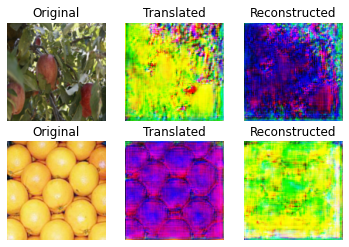

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.3.0.
    Use Pillow instead: ``numpy.array(Image.fromarray(arr).resize())``.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:54: DeprecationWarning:     `imresize` is deprecated!
    `imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.3.0.
    Use Pillow instead: ``numpy.array(Image.fromarray(arr).resize())``.
/tensorflow-1.15.2/python3.7/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


[Epoch 0/100] [Batch 1/15] [D loss: 26.994743, acc:   6%] [G loss: 47.544373, adv: 16.173748, recon: 0.682084, id: 0.917444] time: 0:00:52.065658 
[Epoch 0/100] [Batch 2/15] [D loss: 16.560085, acc:   6%] [G loss: 16.715338, adv: 2.228876, recon: 0.550781, id: 0.748531] time: 0:00:56.706969 
[Epoch 0/100] [Batch 3/15] [D loss: 2.270939, acc:  32%] [G loss: 16.358450, adv: 2.260153, recon: 0.533548, id: 0.666878] time: 0:01:01.340483 
[Epoch 0/100] [Batch 4/15] [D loss: 0.934251, acc:  41%] [G loss: 12.206244, adv: 0.750570, recon: 0.481470, id: 0.591458] time: 0:01:05.971617 
[Epoch 0/100] [Batch 5/15] [D loss: 0.393336, acc:  55%] [G loss: 11.706064, adv: 0.976581, recon: 0.436857, id: 0.537272] time: 0:01:10.631474 
[Epoch 0/100] [Batch 6/15] [D loss: 0.370319, acc:  62%] [G loss: 11.126829, adv: 0.946227, recon: 0.411845, id: 0.519945] time: 0:01:15.307710 
[Epoch 0/100] [Batch 7/15] [D loss: 0.365529, acc:  54%] [G loss: 10.737930, adv: 0.895492, recon: 0.398386, id: 0.501466] time

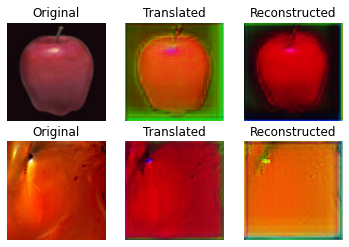

[Epoch 0/100] [Batch 11/15] [D loss: 0.331277, acc:  58%] [G loss: 8.702093, adv: 0.803655, recon: 0.315062, id: 0.398053] time: 0:01:39.174481 
[Epoch 0/100] [Batch 12/15] [D loss: 0.338366, acc:  52%] [G loss: 9.293958, adv: 0.976523, recon: 0.329635, id: 0.389116] time: 0:01:43.853916 
[Epoch 0/100] [Batch 13/15] [D loss: 0.371882, acc:  55%] [G loss: 8.811098, adv: 0.765218, recon: 0.328809, id: 0.367190] time: 0:01:48.511129 
[Epoch 1/100] [Batch 0/15] [D loss: 0.336933, acc:  53%] [G loss: 8.301239, adv: 0.859547, recon: 0.295189, id: 0.359716] time: 0:01:53.205990 


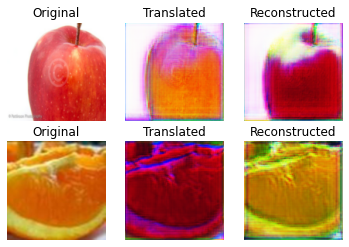

[Epoch 1/100] [Batch 1/15] [D loss: 0.301836, acc:  58%] [G loss: 8.542432, adv: 0.884379, recon: 0.305926, id: 0.348314] time: 0:01:58.287371 
[Epoch 1/100] [Batch 2/15] [D loss: 0.311216, acc:  56%] [G loss: 8.376174, adv: 0.787414, recon: 0.308417, id: 0.309141] time: 0:02:02.954949 
[Epoch 1/100] [Batch 3/15] [D loss: 0.379144, acc:  46%] [G loss: 8.186626, adv: 0.837944, recon: 0.294821, id: 0.332195] time: 0:02:07.636740 
[Epoch 1/100] [Batch 4/15] [D loss: 0.473712, acc:  40%] [G loss: 8.983303, adv: 0.942637, recon: 0.323250, id: 0.353521] time: 0:02:12.319617 
[Epoch 1/100] [Batch 5/15] [D loss: 0.534846, acc:  38%] [G loss: 8.066337, adv: 0.816392, recon: 0.292133, id: 0.298631] time: 0:02:17.000907 
[Epoch 1/100] [Batch 6/15] [D loss: 0.541231, acc:  37%] [G loss: 8.174211, adv: 0.743593, recon: 0.302873, id: 0.351241] time: 0:02:21.669996 
[Epoch 1/100] [Batch 7/15] [D loss: 0.469635, acc:  38%] [G loss: 7.604598, adv: 0.807578, recon: 0.270710, id: 0.292940] time: 0:02:26.

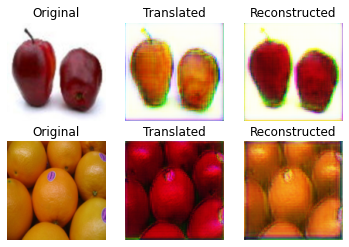

[Epoch 1/100] [Batch 11/15] [D loss: 0.422399, acc:  39%] [G loss: 7.045722, adv: 0.680820, recon: 0.256660, id: 0.303381] time: 0:02:45.668492 
[Epoch 1/100] [Batch 12/15] [D loss: 0.423011, acc:  38%] [G loss: 7.156886, adv: 0.777186, recon: 0.252989, id: 0.287948] time: 0:02:50.354129 
[Epoch 1/100] [Batch 13/15] [D loss: 0.444671, acc:  34%] [G loss: 7.088493, adv: 0.719809, recon: 0.255434, id: 0.298676] time: 0:02:55.033113 
[Epoch 2/100] [Batch 0/15] [D loss: 0.446847, acc:  36%] [G loss: 7.079782, adv: 0.727039, recon: 0.254362, id: 0.285280] time: 0:02:59.692480 


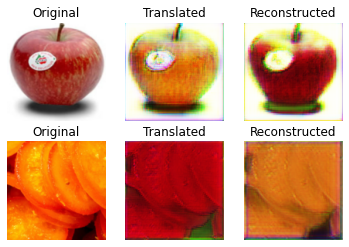

[Epoch 2/100] [Batch 1/15] [D loss: 0.415354, acc:  42%] [G loss: 7.096692, adv: 0.662489, recon: 0.261718, id: 0.276009] time: 0:03:04.803085 
[Epoch 2/100] [Batch 2/15] [D loss: 0.457823, acc:  35%] [G loss: 7.203022, adv: 0.864737, recon: 0.248649, id: 0.241060] time: 0:03:09.463189 
[Epoch 2/100] [Batch 3/15] [D loss: 0.465154, acc:  42%] [G loss: 6.748728, adv: 0.645647, recon: 0.246568, id: 0.295240] time: 0:03:14.170909 
[Epoch 2/100] [Batch 4/15] [D loss: 0.501755, acc:  32%] [G loss: 7.071394, adv: 0.742792, recon: 0.252602, id: 0.295944] time: 0:03:18.808636 
[Epoch 2/100] [Batch 5/15] [D loss: 0.466911, acc:  37%] [G loss: 7.053219, adv: 0.675520, recon: 0.257319, id: 0.306308] time: 0:03:23.456532 
[Epoch 2/100] [Batch 6/15] [D loss: 0.440406, acc:  32%] [G loss: 6.734450, adv: 0.758257, recon: 0.234837, id: 0.275710] time: 0:03:28.084158 
[Epoch 2/100] [Batch 7/15] [D loss: 0.514098, acc:  29%] [G loss: 6.504361, adv: 0.687246, recon: 0.230822, id: 0.262162] time: 0:03:32.

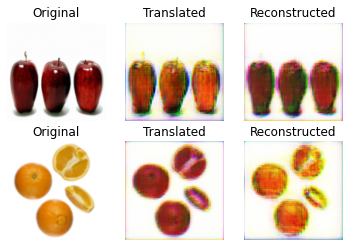

[Epoch 2/100] [Batch 11/15] [D loss: 0.454854, acc:  30%] [G loss: 6.219131, adv: 0.600704, recon: 0.226147, id: 0.257587] time: 0:03:51.812740 
[Epoch 2/100] [Batch 12/15] [D loss: 0.461198, acc:  27%] [G loss: 6.314807, adv: 0.605106, recon: 0.230229, id: 0.273959] time: 0:03:56.495771 
[Epoch 2/100] [Batch 13/15] [D loss: 0.466199, acc:  30%] [G loss: 6.522144, adv: 0.607901, recon: 0.241557, id: 0.234175] time: 0:04:01.189611 
[Epoch 3/100] [Batch 0/15] [D loss: 0.447538, acc:  30%] [G loss: 6.427575, adv: 0.652438, recon: 0.232867, id: 0.245517] time: 0:04:05.876948 


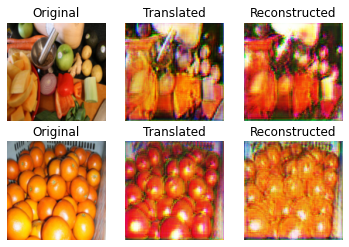

[Epoch 3/100] [Batch 1/15] [D loss: 0.479426, acc:  26%] [G loss: 6.255305, adv: 0.546716, recon: 0.235112, id: 0.225528] time: 0:04:10.927797 
[Epoch 3/100] [Batch 2/15] [D loss: 0.442818, acc:  30%] [G loss: 6.005007, adv: 0.576093, recon: 0.220215, id: 0.230149] time: 0:04:15.576392 
[Epoch 3/100] [Batch 3/15] [D loss: 0.437156, acc:  28%] [G loss: 5.662083, adv: 0.563472, recon: 0.205037, id: 0.226199] time: 0:04:20.225842 
[Epoch 3/100] [Batch 4/15] [D loss: 0.439664, acc:  29%] [G loss: 5.907713, adv: 0.613447, recon: 0.211045, id: 0.254224] time: 0:04:24.905651 
[Epoch 3/100] [Batch 5/15] [D loss: 0.428934, acc:  32%] [G loss: 5.730971, adv: 0.561854, recon: 0.207853, id: 0.234801] time: 0:04:29.592364 
[Epoch 3/100] [Batch 6/15] [D loss: 0.456420, acc:  27%] [G loss: 5.864856, adv: 0.600126, recon: 0.210418, id: 0.241723] time: 0:04:34.247708 
[Epoch 3/100] [Batch 7/15] [D loss: 0.471668, acc:  26%] [G loss: 6.353939, adv: 0.557911, recon: 0.238235, id: 0.226325] time: 0:04:38.

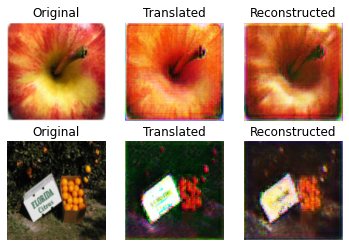

[Epoch 3/100] [Batch 11/15] [D loss: 0.417426, acc:  29%] [G loss: 5.790675, adv: 0.574883, recon: 0.209002, id: 0.242758] time: 0:04:58.001142 
[Epoch 3/100] [Batch 12/15] [D loss: 0.425553, acc:  31%] [G loss: 5.965222, adv: 0.561646, recon: 0.218583, id: 0.231381] time: 0:05:02.669581 
[Epoch 3/100] [Batch 13/15] [D loss: 0.446899, acc:  25%] [G loss: 6.387935, adv: 0.567494, recon: 0.237684, id: 0.265935] time: 0:05:07.326918 
[Epoch 4/100] [Batch 0/15] [D loss: 0.467583, acc:  24%] [G loss: 5.844752, adv: 0.542032, recon: 0.215602, id: 0.227591] time: 0:05:12.020317 


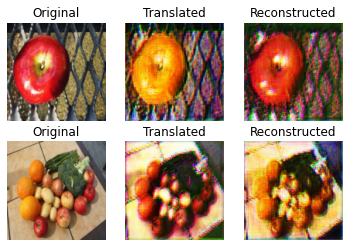

[Epoch 4/100] [Batch 1/15] [D loss: 0.444013, acc:  25%] [G loss: 5.886006, adv: 0.640746, recon: 0.206841, id: 0.261056] time: 0:05:17.075897 
[Epoch 4/100] [Batch 2/15] [D loss: 0.448281, acc:  28%] [G loss: 5.797966, adv: 0.523364, recon: 0.213784, id: 0.241141] time: 0:05:21.733582 
[Epoch 4/100] [Batch 3/15] [D loss: 0.409808, acc:  32%] [G loss: 5.631839, adv: 0.520916, recon: 0.207226, id: 0.229679] time: 0:05:26.392911 
[Epoch 4/100] [Batch 4/15] [D loss: 0.398504, acc:  28%] [G loss: 5.629642, adv: 0.524223, recon: 0.206965, id: 0.223682] time: 0:05:31.072469 
[Epoch 4/100] [Batch 5/15] [D loss: 0.394706, acc:  31%] [G loss: 5.528616, adv: 0.528317, recon: 0.200901, id: 0.237014] time: 0:05:35.747137 
[Epoch 4/100] [Batch 6/15] [D loss: 0.400484, acc:  29%] [G loss: 5.650566, adv: 0.535614, recon: 0.205609, id: 0.236914] time: 0:05:40.409138 
[Epoch 4/100] [Batch 7/15] [D loss: 0.411203, acc:  27%] [G loss: 5.452886, adv: 0.499059, recon: 0.200849, id: 0.232183] time: 0:05:45.

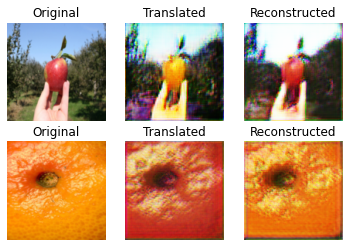

[Epoch 4/100] [Batch 11/15] [D loss: 0.370531, acc:  33%] [G loss: 5.347554, adv: 0.519850, recon: 0.193652, id: 0.236830] time: 0:06:04.158419 
[Epoch 4/100] [Batch 12/15] [D loss: 0.383748, acc:  31%] [G loss: 5.401328, adv: 0.523139, recon: 0.195712, id: 0.231297] time: 0:06:08.805430 
[Epoch 4/100] [Batch 13/15] [D loss: 0.387062, acc:  34%] [G loss: 5.348524, adv: 0.526292, recon: 0.193039, id: 0.228604] time: 0:06:13.478215 
[Epoch 5/100] [Batch 0/15] [D loss: 0.367210, acc:  34%] [G loss: 5.360919, adv: 0.537976, recon: 0.191448, id: 0.237632] time: 0:06:18.135141 


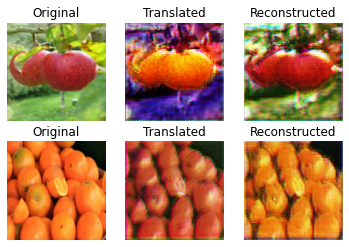

[Epoch 5/100] [Batch 1/15] [D loss: 0.391234, acc:  31%] [G loss: 5.298503, adv: 0.522566, recon: 0.190012, id: 0.240696] time: 0:06:23.221997 
[Epoch 5/100] [Batch 2/15] [D loss: 0.403447, acc:  32%] [G loss: 5.406337, adv: 0.631090, recon: 0.184623, id: 0.230267] time: 0:06:27.897252 
[Epoch 5/100] [Batch 3/15] [D loss: 0.412816, acc:  30%] [G loss: 5.241083, adv: 0.525041, recon: 0.187721, id: 0.241003] time: 0:06:32.560805 
[Epoch 5/100] [Batch 4/15] [D loss: 0.357805, acc:  39%] [G loss: 5.308925, adv: 0.540602, recon: 0.189435, id: 0.225955] time: 0:06:37.218717 
[Epoch 5/100] [Batch 5/15] [D loss: 0.378506, acc:  37%] [G loss: 5.511744, adv: 0.554150, recon: 0.197278, id: 0.244808] time: 0:06:41.905422 
[Epoch 5/100] [Batch 6/15] [D loss: 0.372868, acc:  37%] [G loss: 5.359788, adv: 0.523185, recon: 0.193072, id: 0.230005] time: 0:06:46.560221 
[Epoch 5/100] [Batch 7/15] [D loss: 0.389987, acc:  31%] [G loss: 5.528303, adv: 0.551981, recon: 0.198053, id: 0.253995] time: 0:06:51.

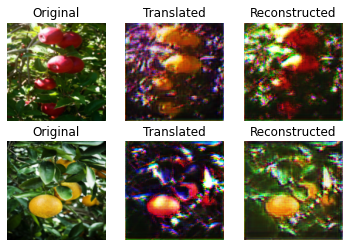

[Epoch 5/100] [Batch 11/15] [D loss: 0.425121, acc:  28%] [G loss: 4.891247, adv: 0.486489, recon: 0.175124, id: 0.208521] time: 0:07:10.329971 
[Epoch 5/100] [Batch 12/15] [D loss: 0.365605, acc:  34%] [G loss: 4.972281, adv: 0.537125, recon: 0.174477, id: 0.221172] time: 0:07:15.041203 
[Epoch 5/100] [Batch 13/15] [D loss: 0.383549, acc:  36%] [G loss: 5.442890, adv: 0.531457, recon: 0.197377, id: 0.225592] time: 0:07:19.714927 
[Epoch 6/100] [Batch 0/15] [D loss: 0.381203, acc:  32%] [G loss: 5.223191, adv: 0.487817, recon: 0.190149, id: 0.241862] time: 0:07:24.390697 


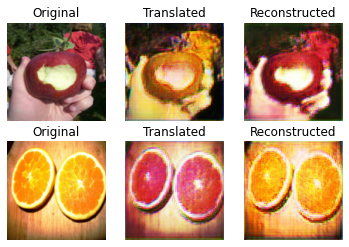

[Epoch 6/100] [Batch 1/15] [D loss: 0.372174, acc:  33%] [G loss: 4.898194, adv: 0.477196, recon: 0.176688, id: 0.205129] time: 0:07:29.453176 
[Epoch 6/100] [Batch 2/15] [D loss: 0.360096, acc:  34%] [G loss: 5.233288, adv: 0.555478, recon: 0.183806, id: 0.235551] time: 0:07:34.117562 
[Epoch 6/100] [Batch 3/15] [D loss: 0.379547, acc:  35%] [G loss: 5.016717, adv: 0.488807, recon: 0.181019, id: 0.214592] time: 0:07:38.772560 
[Epoch 6/100] [Batch 4/15] [D loss: 0.340962, acc:  37%] [G loss: 5.257578, adv: 0.553707, recon: 0.185310, id: 0.248895] time: 0:07:43.418037 
[Epoch 6/100] [Batch 5/15] [D loss: 0.380154, acc:  35%] [G loss: 5.026059, adv: 0.494953, recon: 0.179544, id: 0.232191] time: 0:07:48.083967 
[Epoch 6/100] [Batch 6/15] [D loss: 0.370143, acc:  33%] [G loss: 5.255523, adv: 0.512076, recon: 0.188233, id: 0.258435] time: 0:07:52.733021 
[Epoch 6/100] [Batch 7/15] [D loss: 0.395351, acc:  28%] [G loss: 5.181179, adv: 0.533953, recon: 0.183896, id: 0.221175] time: 0:07:57.

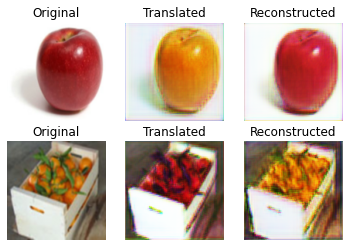

[Epoch 6/100] [Batch 11/15] [D loss: 0.349972, acc:  35%] [G loss: 5.406136, adv: 0.494161, recon: 0.198738, id: 0.223300] time: 0:08:16.461173 
[Epoch 6/100] [Batch 12/15] [D loss: 0.352972, acc:  33%] [G loss: 5.214300, adv: 0.496886, recon: 0.188462, id: 0.242821] time: 0:08:21.100555 
[Epoch 6/100] [Batch 13/15] [D loss: 0.376017, acc:  31%] [G loss: 4.937314, adv: 0.535698, recon: 0.172662, id: 0.211229] time: 0:08:25.781439 
[Epoch 7/100] [Batch 0/15] [D loss: 0.368318, acc:  37%] [G loss: 4.780717, adv: 0.523457, recon: 0.166168, id: 0.207787] time: 0:08:30.459147 


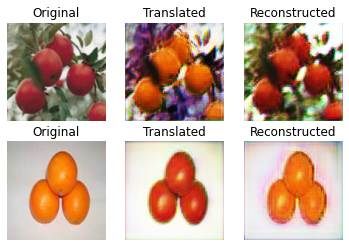

[Epoch 7/100] [Batch 1/15] [D loss: 0.343903, acc:  38%] [G loss: 4.917392, adv: 0.477043, recon: 0.176108, id: 0.232954] time: 0:08:35.507956 
[Epoch 7/100] [Batch 2/15] [D loss: 0.356065, acc:  34%] [G loss: 4.909379, adv: 0.487530, recon: 0.175869, id: 0.208562] time: 0:08:40.168707 
[Epoch 7/100] [Batch 3/15] [D loss: 0.340117, acc:  36%] [G loss: 5.388147, adv: 0.540448, recon: 0.192244, id: 0.249289] time: 0:08:44.833929 
[Epoch 7/100] [Batch 4/15] [D loss: 0.355021, acc:  34%] [G loss: 4.822657, adv: 0.494291, recon: 0.170907, id: 0.211140] time: 0:08:49.482168 
[Epoch 7/100] [Batch 5/15] [D loss: 0.369685, acc:  31%] [G loss: 5.062218, adv: 0.486335, recon: 0.183483, id: 0.233393] time: 0:08:54.176699 
[Epoch 7/100] [Batch 6/15] [D loss: 0.342668, acc:  39%] [G loss: 4.976272, adv: 0.496467, recon: 0.178950, id: 0.201322] time: 0:08:58.874414 
[Epoch 7/100] [Batch 7/15] [D loss: 0.354413, acc:  34%] [G loss: 4.988988, adv: 0.500014, recon: 0.177613, id: 0.249529] time: 0:09:03.

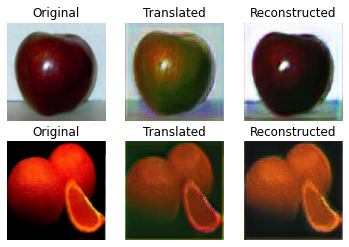

[Epoch 7/100] [Batch 11/15] [D loss: 0.368308, acc:  35%] [G loss: 4.921480, adv: 0.486598, recon: 0.175874, id: 0.235306] time: 0:09:22.563819 
[Epoch 7/100] [Batch 12/15] [D loss: 0.355472, acc:  35%] [G loss: 4.534295, adv: 0.477313, recon: 0.158312, id: 0.215198] time: 0:09:27.259783 
[Epoch 7/100] [Batch 13/15] [D loss: 0.342813, acc:  38%] [G loss: 4.691770, adv: 0.479051, recon: 0.165046, id: 0.230949] time: 0:09:31.910643 
[Epoch 8/100] [Batch 0/15] [D loss: 0.338602, acc:  38%] [G loss: 4.762445, adv: 0.497175, recon: 0.168276, id: 0.194505] time: 0:09:36.552995 


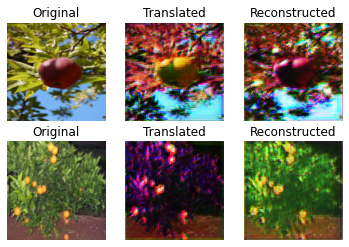

[Epoch 8/100] [Batch 1/15] [D loss: 0.340108, acc:  39%] [G loss: 4.895328, adv: 0.524092, recon: 0.171366, id: 0.225410] time: 0:09:41.877282 
[Epoch 8/100] [Batch 2/15] [D loss: 0.342980, acc:  39%] [G loss: 4.834453, adv: 0.482176, recon: 0.172784, id: 0.211381] time: 0:09:46.536348 
[Epoch 8/100] [Batch 3/15] [D loss: 0.358072, acc:  34%] [G loss: 4.821407, adv: 0.506321, recon: 0.168626, id: 0.239423] time: 0:09:51.215280 
[Epoch 8/100] [Batch 4/15] [D loss: 0.332131, acc:  42%] [G loss: 4.719161, adv: 0.499245, recon: 0.164119, id: 0.241360] time: 0:09:55.894765 
[Epoch 8/100] [Batch 5/15] [D loss: 0.354977, acc:  40%] [G loss: 4.709002, adv: 0.489621, recon: 0.164142, id: 0.241019] time: 0:10:00.594985 
[Epoch 8/100] [Batch 6/15] [D loss: 0.351193, acc:  38%] [G loss: 4.664634, adv: 0.449899, recon: 0.166184, id: 0.236558] time: 0:10:05.320707 
[Epoch 8/100] [Batch 7/15] [D loss: 0.343840, acc:  31%] [G loss: 4.543534, adv: 0.452748, recon: 0.161130, id: 0.225548] time: 0:10:10.

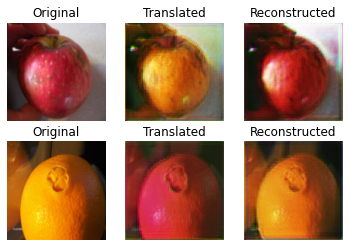

[Epoch 8/100] [Batch 11/15] [D loss: 0.329356, acc:  43%] [G loss: 4.592719, adv: 0.486647, recon: 0.161054, id: 0.214208] time: 0:10:29.138732 
[Epoch 8/100] [Batch 12/15] [D loss: 0.356044, acc:  35%] [G loss: 4.801474, adv: 0.488342, recon: 0.170078, id: 0.217693] time: 0:10:33.812727 
[Epoch 8/100] [Batch 13/15] [D loss: 0.345039, acc:  39%] [G loss: 4.845768, adv: 0.482615, recon: 0.172111, id: 0.242919] time: 0:10:38.483305 
[Epoch 9/100] [Batch 0/15] [D loss: 0.323087, acc:  41%] [G loss: 4.693395, adv: 0.495177, recon: 0.164428, id: 0.209695] time: 0:10:43.169082 


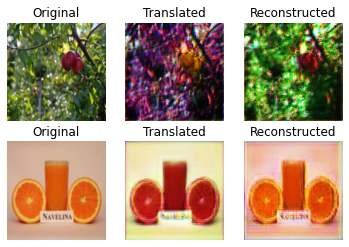

[Epoch 9/100] [Batch 1/15] [D loss: 0.348687, acc:  41%] [G loss: 4.623714, adv: 0.480545, recon: 0.161550, id: 0.229602] time: 0:10:48.236432 
[Epoch 9/100] [Batch 2/15] [D loss: 0.337431, acc:  37%] [G loss: 4.819390, adv: 0.464642, recon: 0.172857, id: 0.232306] time: 0:10:52.918856 
[Epoch 9/100] [Batch 3/15] [D loss: 0.333535, acc:  34%] [G loss: 5.014141, adv: 0.495815, recon: 0.179098, id: 0.241022] time: 0:10:57.604762 
[Epoch 9/100] [Batch 4/15] [D loss: 0.354039, acc:  35%] [G loss: 4.611549, adv: 0.471183, recon: 0.163243, id: 0.208979] time: 0:11:02.302747 
[Epoch 9/100] [Batch 5/15] [D loss: 0.345375, acc:  35%] [G loss: 4.590117, adv: 0.455750, recon: 0.163510, id: 0.214835] time: 0:11:06.956912 
[Epoch 9/100] [Batch 6/15] [D loss: 0.325448, acc:  42%] [G loss: 4.865511, adv: 0.510355, recon: 0.171544, id: 0.217983] time: 0:11:11.643760 
[Epoch 9/100] [Batch 7/15] [D loss: 0.334031, acc:  40%] [G loss: 4.612380, adv: 0.472216, recon: 0.162793, id: 0.211752] time: 0:11:16.

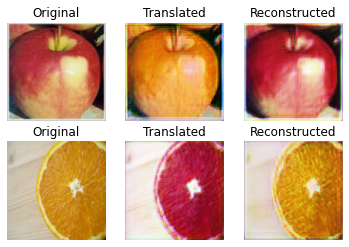

[Epoch 9/100] [Batch 11/15] [D loss: 0.347688, acc:  40%] [G loss: 4.827808, adv: 0.457003, recon: 0.174419, id: 0.229527] time: 0:11:35.442549 
[Epoch 9/100] [Batch 12/15] [D loss: 0.351847, acc:  37%] [G loss: 4.524354, adv: 0.461028, recon: 0.159414, id: 0.214332] time: 0:11:40.138893 
[Epoch 9/100] [Batch 13/15] [D loss: 0.327519, acc:  40%] [G loss: 4.867747, adv: 0.540039, recon: 0.167001, id: 0.253998] time: 0:11:44.809176 
[Epoch 10/100] [Batch 0/15] [D loss: 0.356273, acc:  36%] [G loss: 4.480217, adv: 0.466010, recon: 0.157120, id: 0.213332] time: 0:11:49.490946 


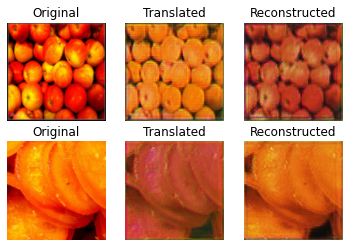

[Epoch 10/100] [Batch 1/15] [D loss: 0.326979, acc:  37%] [G loss: 4.788869, adv: 0.493393, recon: 0.168727, id: 0.245693] time: 0:11:54.579970 
[Epoch 10/100] [Batch 2/15] [D loss: 0.354195, acc:  40%] [G loss: 4.645538, adv: 0.452907, recon: 0.165919, id: 0.213571] time: 0:11:59.221072 
[Epoch 10/100] [Batch 3/15] [D loss: 0.331882, acc:  40%] [G loss: 4.741123, adv: 0.455257, recon: 0.170065, id: 0.241699] time: 0:12:03.910360 
[Epoch 10/100] [Batch 4/15] [D loss: 0.328917, acc:  41%] [G loss: 4.712781, adv: 0.493467, recon: 0.166687, id: 0.186182] time: 0:12:08.620411 
[Epoch 10/100] [Batch 5/15] [D loss: 0.327992, acc:  43%] [G loss: 4.723678, adv: 0.494092, recon: 0.165761, id: 0.235717] time: 0:12:13.305485 
[Epoch 10/100] [Batch 6/15] [D loss: 0.319406, acc:  42%] [G loss: 4.393137, adv: 0.470330, recon: 0.152843, id: 0.206983] time: 0:12:17.977792 
[Epoch 10/100] [Batch 7/15] [D loss: 0.300850, acc:  42%] [G loss: 4.593428, adv: 0.475648, recon: 0.161035, id: 0.224235] time: 0

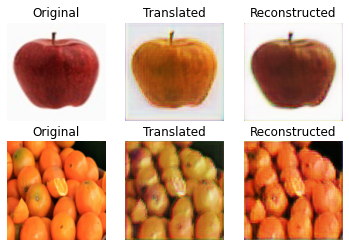

[Epoch 10/100] [Batch 11/15] [D loss: 0.332170, acc:  38%] [G loss: 4.792428, adv: 0.460524, recon: 0.170996, id: 0.248914] time: 0:12:41.811186 
[Epoch 10/100] [Batch 12/15] [D loss: 0.322415, acc:  42%] [G loss: 4.977391, adv: 0.501545, recon: 0.176849, id: 0.228472] time: 0:12:46.511173 
[Epoch 10/100] [Batch 13/15] [D loss: 0.319054, acc:  43%] [G loss: 4.652052, adv: 0.509011, recon: 0.160923, id: 0.217667] time: 0:12:51.210792 
[Epoch 11/100] [Batch 0/15] [D loss: 0.335053, acc:  40%] [G loss: 4.279066, adv: 0.478133, recon: 0.146139, id: 0.208921] time: 0:12:55.918848 


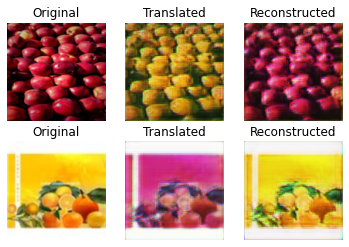

[Epoch 11/100] [Batch 1/15] [D loss: 0.315407, acc:  43%] [G loss: 4.352685, adv: 0.456328, recon: 0.151552, id: 0.214614] time: 0:13:01.039115 
[Epoch 11/100] [Batch 2/15] [D loss: 0.296311, acc:  44%] [G loss: 4.494232, adv: 0.475920, recon: 0.156573, id: 0.210932] time: 0:13:05.722473 
[Epoch 11/100] [Batch 3/15] [D loss: 0.314496, acc:  41%] [G loss: 4.391495, adv: 0.446043, recon: 0.154874, id: 0.216881] time: 0:13:10.399505 
[Epoch 11/100] [Batch 4/15] [D loss: 0.337573, acc:  37%] [G loss: 4.792989, adv: 0.456621, recon: 0.172810, id: 0.216053] time: 0:13:15.129907 
[Epoch 11/100] [Batch 5/15] [D loss: 0.327471, acc:  39%] [G loss: 4.480443, adv: 0.481613, recon: 0.155751, id: 0.216536] time: 0:13:19.844828 
[Epoch 11/100] [Batch 6/15] [D loss: 0.317893, acc:  44%] [G loss: 4.367264, adv: 0.446902, recon: 0.152938, id: 0.211770] time: 0:13:24.558630 
[Epoch 11/100] [Batch 7/15] [D loss: 0.311014, acc:  42%] [G loss: 4.418304, adv: 0.488031, recon: 0.150799, id: 0.229443] time: 0

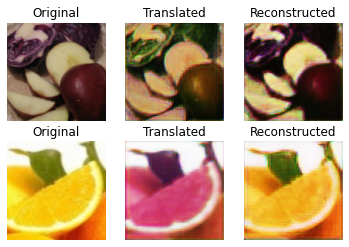

[Epoch 11/100] [Batch 11/15] [D loss: 0.325561, acc:  47%] [G loss: 4.428401, adv: 0.513380, recon: 0.149602, id: 0.228632] time: 0:13:48.471199 
[Epoch 11/100] [Batch 12/15] [D loss: 0.389901, acc:  37%] [G loss: 4.656748, adv: 0.517450, recon: 0.159414, id: 0.231623] time: 0:13:53.159291 
[Epoch 11/100] [Batch 13/15] [D loss: 0.316879, acc:  46%] [G loss: 4.480800, adv: 0.456349, recon: 0.157952, id: 0.226938] time: 0:13:57.848450 
[Epoch 12/100] [Batch 0/15] [D loss: 0.297642, acc:  47%] [G loss: 4.259791, adv: 0.471674, recon: 0.146040, id: 0.205601] time: 0:14:02.543039 


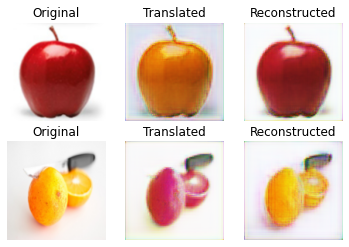

[Epoch 12/100] [Batch 1/15] [D loss: 0.356309, acc:  39%] [G loss: 4.107871, adv: 0.404442, recon: 0.145312, id: 0.205774] time: 0:14:07.629398 
[Epoch 12/100] [Batch 2/15] [D loss: 0.335958, acc:  42%] [G loss: 4.194370, adv: 0.462798, recon: 0.143266, id: 0.210766] time: 0:14:12.343897 
[Epoch 12/100] [Batch 3/15] [D loss: 0.323594, acc:  40%] [G loss: 4.294580, adv: 0.470527, recon: 0.146398, id: 0.231343] time: 0:14:17.085694 
[Epoch 12/100] [Batch 4/15] [D loss: 0.326566, acc:  42%] [G loss: 4.383477, adv: 0.473519, recon: 0.151240, id: 0.218279] time: 0:14:21.785441 
[Epoch 12/100] [Batch 5/15] [D loss: 0.335313, acc:  40%] [G loss: 4.631387, adv: 0.495908, recon: 0.160065, id: 0.244858] time: 0:14:26.471198 
[Epoch 12/100] [Batch 6/15] [D loss: 0.320775, acc:  44%] [G loss: 4.372818, adv: 0.442563, recon: 0.153740, id: 0.211561] time: 0:14:31.150910 
[Epoch 12/100] [Batch 7/15] [D loss: 0.317619, acc:  40%] [G loss: 4.531727, adv: 0.465477, recon: 0.158675, id: 0.232556] time: 0

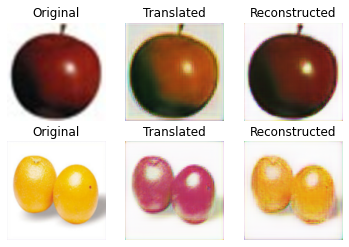

[Epoch 12/100] [Batch 11/15] [D loss: 0.305010, acc:  44%] [G loss: 4.448308, adv: 0.452725, recon: 0.156191, id: 0.236897] time: 0:14:54.990884 
[Epoch 12/100] [Batch 12/15] [D loss: 0.306683, acc:  43%] [G loss: 4.507539, adv: 0.450258, recon: 0.159300, id: 0.224248] time: 0:14:59.669576 
[Epoch 12/100] [Batch 13/15] [D loss: 0.292383, acc:  47%] [G loss: 4.622480, adv: 0.475891, recon: 0.161978, id: 0.230803] time: 0:15:04.356822 
[Epoch 13/100] [Batch 0/15] [D loss: 0.322762, acc:  39%] [G loss: 4.368065, adv: 0.436104, recon: 0.153927, id: 0.212227] time: 0:15:09.052881 


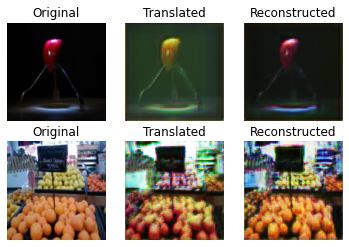

[Epoch 13/100] [Batch 1/15] [D loss: 0.295973, acc:  44%] [G loss: 4.185695, adv: 0.457244, recon: 0.142956, id: 0.227287] time: 0:15:14.142263 
[Epoch 13/100] [Batch 2/15] [D loss: 0.297156, acc:  45%] [G loss: 4.003115, adv: 0.450314, recon: 0.136313, id: 0.186403] time: 0:15:18.801252 
[Epoch 13/100] [Batch 3/15] [D loss: 0.306828, acc:  44%] [G loss: 4.260450, adv: 0.433186, recon: 0.149566, id: 0.222740] time: 0:15:23.502588 
[Epoch 13/100] [Batch 4/15] [D loss: 0.311405, acc:  43%] [G loss: 4.394210, adv: 0.456300, recon: 0.153960, id: 0.205543] time: 0:15:28.238745 
[Epoch 13/100] [Batch 5/15] [D loss: 0.292847, acc:  49%] [G loss: 4.274206, adv: 0.472939, recon: 0.146274, id: 0.212846] time: 0:15:32.927845 
[Epoch 13/100] [Batch 6/15] [D loss: 0.286480, acc:  48%] [G loss: 4.254458, adv: 0.470813, recon: 0.145233, id: 0.209563] time: 0:15:37.597278 
[Epoch 13/100] [Batch 7/15] [D loss: 0.307768, acc:  45%] [G loss: 4.644916, adv: 0.490875, recon: 0.161719, id: 0.229718] time: 0

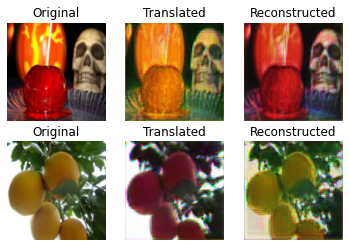

[Epoch 13/100] [Batch 11/15] [D loss: 0.340141, acc:  37%] [G loss: 4.497055, adv: 0.455277, recon: 0.158264, id: 0.233032] time: 0:16:01.522393 
[Epoch 13/100] [Batch 12/15] [D loss: 0.319012, acc:  43%] [G loss: 4.659811, adv: 0.481655, recon: 0.162764, id: 0.251169] time: 0:16:06.226698 
[Epoch 13/100] [Batch 13/15] [D loss: 0.317607, acc:  42%] [G loss: 4.247126, adv: 0.434439, recon: 0.148697, id: 0.224501] time: 0:16:10.890524 
[Epoch 14/100] [Batch 0/15] [D loss: 0.304639, acc:  43%] [G loss: 4.257461, adv: 0.423764, recon: 0.149989, id: 0.208265] time: 0:16:15.606739 


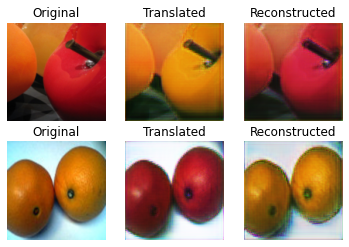

[Epoch 14/100] [Batch 1/15] [D loss: 0.301602, acc:  44%] [G loss: 4.141358, adv: 0.442047, recon: 0.142994, id: 0.214858] time: 0:16:21.013229 
[Epoch 14/100] [Batch 2/15] [D loss: 0.299760, acc:  44%] [G loss: 4.203853, adv: 0.445331, recon: 0.145932, id: 0.203047] time: 0:16:25.676730 
[Epoch 14/100] [Batch 3/15] [D loss: 0.290390, acc:  44%] [G loss: 4.224304, adv: 0.441075, recon: 0.146108, id: 0.229127] time: 0:16:30.382552 
[Epoch 14/100] [Batch 4/15] [D loss: 0.293469, acc:  44%] [G loss: 4.008406, adv: 0.437140, recon: 0.137841, id: 0.188032] time: 0:16:35.122445 
[Epoch 14/100] [Batch 5/15] [D loss: 0.321258, acc:  39%] [G loss: 4.329624, adv: 0.416969, recon: 0.154083, id: 0.232348] time: 0:16:39.799782 
[Epoch 14/100] [Batch 6/15] [D loss: 0.301247, acc:  43%] [G loss: 4.538644, adv: 0.452030, recon: 0.161269, id: 0.209557] time: 0:16:44.535812 
[Epoch 14/100] [Batch 7/15] [D loss: 0.304215, acc:  41%] [G loss: 4.342744, adv: 0.429501, recon: 0.153212, id: 0.240223] time: 0

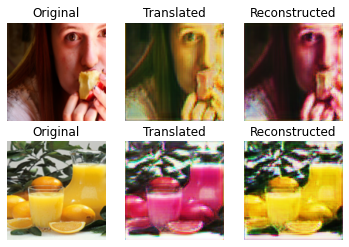

[Epoch 14/100] [Batch 11/15] [D loss: 0.318791, acc:  40%] [G loss: 4.333715, adv: 0.439416, recon: 0.151986, id: 0.237459] time: 0:17:08.496433 
[Epoch 14/100] [Batch 12/15] [D loss: 0.290601, acc:  48%] [G loss: 4.451797, adv: 0.468327, recon: 0.155314, id: 0.221051] time: 0:17:13.195164 
[Epoch 14/100] [Batch 13/15] [D loss: 0.315361, acc:  41%] [G loss: 4.079844, adv: 0.431457, recon: 0.141873, id: 0.207459] time: 0:17:17.903378 
[Epoch 15/100] [Batch 0/15] [D loss: 0.298464, acc:  48%] [G loss: 4.084736, adv: 0.435107, recon: 0.140128, id: 0.218483] time: 0:17:22.588749 


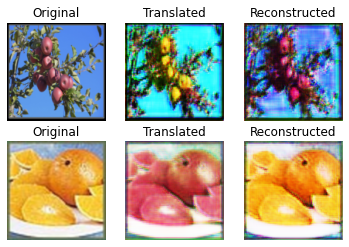

[Epoch 15/100] [Batch 1/15] [D loss: 0.277315, acc:  48%] [G loss: 4.199503, adv: 0.496118, recon: 0.140567, id: 0.217641] time: 0:17:27.705531 
[Epoch 15/100] [Batch 2/15] [D loss: 0.304100, acc:  46%] [G loss: 4.325129, adv: 0.468480, recon: 0.149235, id: 0.207148] time: 0:17:32.393508 
[Epoch 15/100] [Batch 3/15] [D loss: 0.314576, acc:  45%] [G loss: 4.533863, adv: 0.500681, recon: 0.155276, id: 0.237321] time: 0:17:37.102499 
[Epoch 15/100] [Batch 4/15] [D loss: 0.308032, acc:  46%] [G loss: 4.120305, adv: 0.434792, recon: 0.143552, id: 0.191877] time: 0:17:41.805649 
[Epoch 15/100] [Batch 5/15] [D loss: 0.307294, acc:  42%] [G loss: 4.043051, adv: 0.414336, recon: 0.140219, id: 0.213985] time: 0:17:46.517308 
[Epoch 15/100] [Batch 6/15] [D loss: 0.286168, acc:  48%] [G loss: 4.184090, adv: 0.474351, recon: 0.140675, id: 0.232426] time: 0:17:51.239620 
[Epoch 15/100] [Batch 7/15] [D loss: 0.295885, acc:  47%] [G loss: 4.087104, adv: 0.449091, recon: 0.139134, id: 0.215160] time: 0

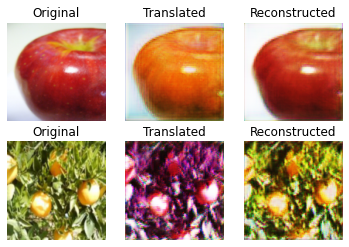

[Epoch 15/100] [Batch 11/15] [D loss: 0.301858, acc:  48%] [G loss: 4.172192, adv: 0.493318, recon: 0.139671, id: 0.211528] time: 0:18:15.202664 
[Epoch 15/100] [Batch 12/15] [D loss: 0.314047, acc:  45%] [G loss: 3.968365, adv: 0.412270, recon: 0.137186, id: 0.215032] time: 0:18:19.910842 
[Epoch 15/100] [Batch 13/15] [D loss: 0.301709, acc:  43%] [G loss: 4.267075, adv: 0.438579, recon: 0.148572, id: 0.229137] time: 0:18:24.608471 
[Epoch 16/100] [Batch 0/15] [D loss: 0.282082, acc:  49%] [G loss: 4.261913, adv: 0.438537, recon: 0.147935, id: 0.221817] time: 0:18:29.334394 


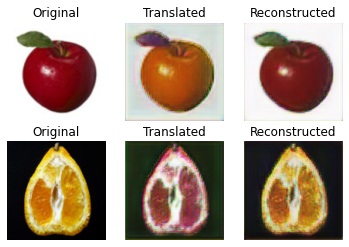

[Epoch 16/100] [Batch 1/15] [D loss: 0.273380, acc:  51%] [G loss: 4.151879, adv: 0.445190, recon: 0.142856, id: 0.220464] time: 0:18:34.433042 
[Epoch 16/100] [Batch 2/15] [D loss: 0.292508, acc:  45%] [G loss: 4.267954, adv: 0.440510, recon: 0.150342, id: 0.197003] time: 0:18:39.119743 
[Epoch 16/100] [Batch 3/15] [D loss: 0.302881, acc:  41%] [G loss: 4.192370, adv: 0.409968, recon: 0.148333, id: 0.217567] time: 0:18:43.822245 
[Epoch 16/100] [Batch 4/15] [D loss: 0.306600, acc:  45%] [G loss: 4.256435, adv: 0.459579, recon: 0.146680, id: 0.215882] time: 0:18:48.549421 
[Epoch 16/100] [Batch 5/15] [D loss: 0.328061, acc:  44%] [G loss: 3.987785, adv: 0.454721, recon: 0.134681, id: 0.215285] time: 0:18:53.264831 
[Epoch 16/100] [Batch 6/15] [D loss: 0.312566, acc:  46%] [G loss: 4.298123, adv: 0.541918, recon: 0.140895, id: 0.208984] time: 0:18:57.982911 
[Epoch 16/100] [Batch 7/15] [D loss: 0.320121, acc:  44%] [G loss: 4.121940, adv: 0.418551, recon: 0.143127, id: 0.237240] time: 0

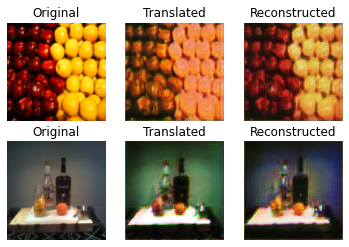

[Epoch 16/100] [Batch 11/15] [D loss: 0.295828, acc:  45%] [G loss: 3.935781, adv: 0.415360, recon: 0.135204, id: 0.215867] time: 0:19:21.986247 
[Epoch 16/100] [Batch 12/15] [D loss: 0.317720, acc:  41%] [G loss: 4.229886, adv: 0.415666, recon: 0.148622, id: 0.219748] time: 0:19:26.728713 
[Epoch 16/100] [Batch 13/15] [D loss: 0.302100, acc:  43%] [G loss: 4.334847, adv: 0.435429, recon: 0.151716, id: 0.226078] time: 0:19:31.454753 
[Epoch 17/100] [Batch 0/15] [D loss: 0.288965, acc:  44%] [G loss: 4.185747, adv: 0.452817, recon: 0.144694, id: 0.208513] time: 0:19:36.156439 


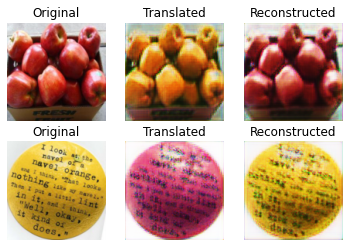

[Epoch 17/100] [Batch 1/15] [D loss: 0.296885, acc:  48%] [G loss: 4.096243, adv: 0.445224, recon: 0.140255, id: 0.215934] time: 0:19:41.289254 
[Epoch 17/100] [Batch 2/15] [D loss: 0.278107, acc:  52%] [G loss: 4.104383, adv: 0.424591, recon: 0.143211, id: 0.195472] time: 0:19:46.001617 
[Epoch 17/100] [Batch 3/15] [D loss: 0.289856, acc:  46%] [G loss: 4.160227, adv: 0.467931, recon: 0.141305, id: 0.204810] time: 0:19:50.727832 
[Epoch 17/100] [Batch 4/15] [D loss: 0.286625, acc:  50%] [G loss: 3.921118, adv: 0.456494, recon: 0.130462, id: 0.212071] time: 0:19:55.452324 
[Epoch 17/100] [Batch 5/15] [D loss: 0.296888, acc:  46%] [G loss: 3.857808, adv: 0.439384, recon: 0.130188, id: 0.200138] time: 0:20:00.139444 
[Epoch 17/100] [Batch 6/15] [D loss: 0.301750, acc:  46%] [G loss: 4.159532, adv: 0.419163, recon: 0.145295, id: 0.223068] time: 0:20:04.852478 
[Epoch 17/100] [Batch 7/15] [D loss: 0.289346, acc:  48%] [G loss: 4.022131, adv: 0.435139, recon: 0.137945, id: 0.218484] time: 0

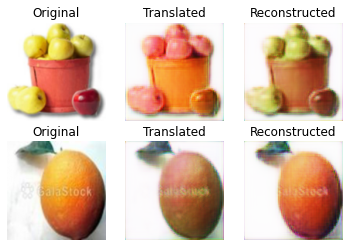

[Epoch 17/100] [Batch 11/15] [D loss: 0.295959, acc:  44%] [G loss: 4.428930, adv: 0.419946, recon: 0.157973, id: 0.239214] time: 0:20:28.870544 
[Epoch 17/100] [Batch 12/15] [D loss: 0.313693, acc:  39%] [G loss: 4.284869, adv: 0.477594, recon: 0.145910, id: 0.213459] time: 0:20:33.769655 
[Epoch 17/100] [Batch 13/15] [D loss: 0.289653, acc:  48%] [G loss: 3.885887, adv: 0.461556, recon: 0.129099, id: 0.187952] time: 0:20:38.465530 
[Epoch 18/100] [Batch 0/15] [D loss: 0.281482, acc:  50%] [G loss: 4.064577, adv: 0.451837, recon: 0.138608, id: 0.193311] time: 0:20:43.187015 


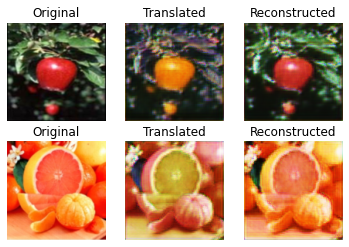

[Epoch 18/100] [Batch 1/15] [D loss: 0.273321, acc:  51%] [G loss: 4.020506, adv: 0.440881, recon: 0.137392, id: 0.220076] time: 0:20:48.356412 
[Epoch 18/100] [Batch 2/15] [D loss: 0.280176, acc:  49%] [G loss: 4.223379, adv: 0.460912, recon: 0.145297, id: 0.206368] time: 0:20:53.077959 
[Epoch 18/100] [Batch 3/15] [D loss: 0.290487, acc:  48%] [G loss: 4.079187, adv: 0.436834, recon: 0.139725, id: 0.231318] time: 0:20:57.804711 
[Epoch 18/100] [Batch 4/15] [D loss: 0.287784, acc:  49%] [G loss: 4.019803, adv: 0.437001, recon: 0.137444, id: 0.203454] time: 0:21:02.513654 
[Epoch 18/100] [Batch 5/15] [D loss: 0.293951, acc:  45%] [G loss: 4.282364, adv: 0.451397, recon: 0.148449, id: 0.222886] time: 0:21:07.225442 
[Epoch 18/100] [Batch 6/15] [D loss: 0.320451, acc:  42%] [G loss: 4.033642, adv: 0.416888, recon: 0.139121, id: 0.211151] time: 0:21:11.935897 
[Epoch 18/100] [Batch 7/15] [D loss: 0.269855, acc:  52%] [G loss: 4.029537, adv: 0.437964, recon: 0.138189, id: 0.208475] time: 0

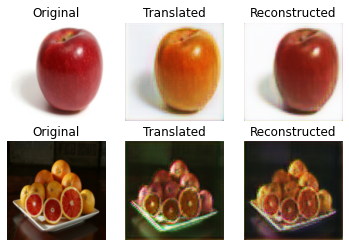

[Epoch 18/100] [Batch 11/15] [D loss: 0.269847, acc:  52%] [G loss: 3.973441, adv: 0.443368, recon: 0.134304, id: 0.221654] time: 0:21:35.987590 
[Epoch 18/100] [Batch 12/15] [D loss: 0.288898, acc:  45%] [G loss: 3.951586, adv: 0.414932, recon: 0.136110, id: 0.213019] time: 0:21:40.708207 
[Epoch 18/100] [Batch 13/15] [D loss: 0.287223, acc:  46%] [G loss: 3.855056, adv: 0.431378, recon: 0.130098, id: 0.213085] time: 0:21:45.416585 
[Epoch 19/100] [Batch 0/15] [D loss: 0.293769, acc:  47%] [G loss: 4.043732, adv: 0.419148, recon: 0.140943, id: 0.193874] time: 0:21:50.126659 


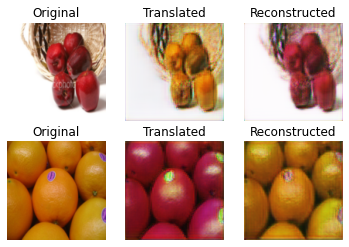

[Epoch 19/100] [Batch 1/15] [D loss: 0.279877, acc:  49%] [G loss: 4.210494, adv: 0.476250, recon: 0.142692, id: 0.224474] time: 0:21:55.259154 
[Epoch 19/100] [Batch 2/15] [D loss: 0.291236, acc:  50%] [G loss: 4.138465, adv: 0.451031, recon: 0.140898, id: 0.214220] time: 0:21:59.955791 
[Epoch 19/100] [Batch 3/15] [D loss: 0.285670, acc:  47%] [G loss: 3.947182, adv: 0.442200, recon: 0.133180, id: 0.211574] time: 0:22:04.673929 
[Epoch 19/100] [Batch 4/15] [D loss: 0.290066, acc:  47%] [G loss: 4.092516, adv: 0.439360, recon: 0.141120, id: 0.202284] time: 0:22:09.367582 
[Epoch 19/100] [Batch 5/15] [D loss: 0.281625, acc:  50%] [G loss: 4.121038, adv: 0.448107, recon: 0.140742, id: 0.226335] time: 0:22:14.081124 
[Epoch 19/100] [Batch 6/15] [D loss: 0.287200, acc:  50%] [G loss: 3.808404, adv: 0.460911, recon: 0.124336, id: 0.216400] time: 0:22:18.799585 
[Epoch 19/100] [Batch 7/15] [D loss: 0.297566, acc:  51%] [G loss: 4.126292, adv: 0.447812, recon: 0.141215, id: 0.220920] time: 0

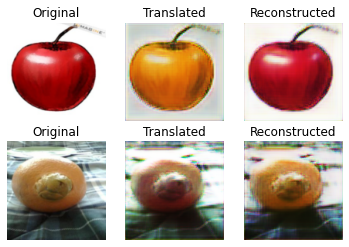

[Epoch 19/100] [Batch 11/15] [D loss: 0.307919, acc:  42%] [G loss: 3.844578, adv: 0.429830, recon: 0.128839, id: 0.219725] time: 0:22:42.765937 
[Epoch 19/100] [Batch 12/15] [D loss: 0.289096, acc:  48%] [G loss: 3.997055, adv: 0.425359, recon: 0.137125, id: 0.219098] time: 0:22:47.457752 
[Epoch 19/100] [Batch 13/15] [D loss: 0.295390, acc:  46%] [G loss: 4.025953, adv: 0.419546, recon: 0.140518, id: 0.186788] time: 0:22:52.134069 
[Epoch 20/100] [Batch 0/15] [D loss: 0.284490, acc:  50%] [G loss: 4.170442, adv: 0.439652, recon: 0.143893, id: 0.230871] time: 0:22:56.852986 


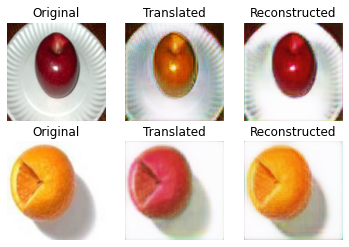

[Epoch 20/100] [Batch 1/15] [D loss: 0.293605, acc:  44%] [G loss: 3.982575, adv: 0.427085, recon: 0.136837, id: 0.211898] time: 0:23:01.994052 
[Epoch 20/100] [Batch 2/15] [D loss: 0.273670, acc:  51%] [G loss: 3.910719, adv: 0.449837, recon: 0.130502, id: 0.229801] time: 0:23:06.715459 
[Epoch 20/100] [Batch 3/15] [D loss: 0.297588, acc:  49%] [G loss: 3.757206, adv: 0.438550, recon: 0.125612, id: 0.192585] time: 0:23:11.407002 
[Epoch 20/100] [Batch 4/15] [D loss: 0.281629, acc:  50%] [G loss: 3.657137, adv: 0.425499, recon: 0.121586, id: 0.195103] time: 0:23:16.123603 
[Epoch 20/100] [Batch 5/15] [D loss: 0.268894, acc:  51%] [G loss: 4.013411, adv: 0.453414, recon: 0.135099, id: 0.202209] time: 0:23:20.842114 
[Epoch 20/100] [Batch 6/15] [D loss: 0.293842, acc:  44%] [G loss: 4.343327, adv: 0.430524, recon: 0.154129, id: 0.207075] time: 0:23:25.540427 
[Epoch 20/100] [Batch 7/15] [D loss: 0.288887, acc:  49%] [G loss: 4.066354, adv: 0.424319, recon: 0.140540, id: 0.200776] time: 0

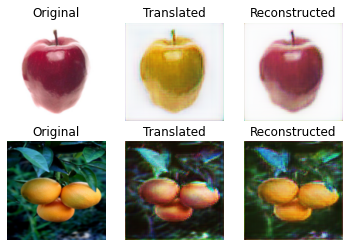

[Epoch 20/100] [Batch 11/15] [D loss: 0.268452, acc:  55%] [G loss: 4.033097, adv: 0.491624, recon: 0.132916, id: 0.194902] time: 0:23:49.745510 
[Epoch 20/100] [Batch 12/15] [D loss: 0.278263, acc:  52%] [G loss: 4.349424, adv: 0.477415, recon: 0.149608, id: 0.230591] time: 0:23:54.460955 
[Epoch 20/100] [Batch 13/15] [D loss: 0.308916, acc:  47%] [G loss: 3.819397, adv: 0.408659, recon: 0.131111, id: 0.193613] time: 0:23:59.161064 
[Epoch 21/100] [Batch 0/15] [D loss: 0.285462, acc:  49%] [G loss: 3.849412, adv: 0.438111, recon: 0.127673, id: 0.233403] time: 0:24:03.864788 


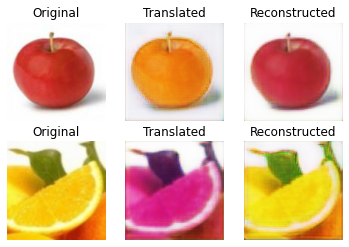

[Epoch 21/100] [Batch 1/15] [D loss: 0.300127, acc:  46%] [G loss: 3.957072, adv: 0.443107, recon: 0.133472, id: 0.212434] time: 0:24:08.983251 
[Epoch 21/100] [Batch 2/15] [D loss: 0.273951, acc:  53%] [G loss: 3.907788, adv: 0.438030, recon: 0.132365, id: 0.201826] time: 0:24:13.662245 
[Epoch 21/100] [Batch 3/15] [D loss: 0.274941, acc:  49%] [G loss: 3.808231, adv: 0.436988, recon: 0.127297, id: 0.200742] time: 0:24:18.340714 
[Epoch 21/100] [Batch 4/15] [D loss: 0.278022, acc:  50%] [G loss: 3.890040, adv: 0.425078, recon: 0.131718, id: 0.217598] time: 0:24:23.053782 
[Epoch 21/100] [Batch 5/15] [D loss: 0.268849, acc:  52%] [G loss: 3.951646, adv: 0.446955, recon: 0.132248, id: 0.211027] time: 0:24:27.780772 
[Epoch 21/100] [Batch 6/15] [D loss: 0.298430, acc:  48%] [G loss: 4.236597, adv: 0.439126, recon: 0.147541, id: 0.199042] time: 0:24:32.473481 
[Epoch 21/100] [Batch 7/15] [D loss: 0.283015, acc:  47%] [G loss: 4.180022, adv: 0.450950, recon: 0.143731, id: 0.222917] time: 0

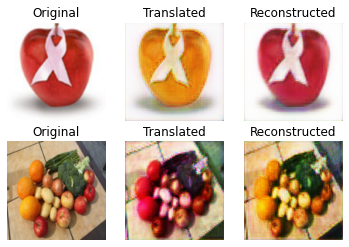

[Epoch 21/100] [Batch 11/15] [D loss: 0.275770, acc:  47%] [G loss: 4.039115, adv: 0.437529, recon: 0.138078, id: 0.219509] time: 0:24:56.432027 
[Epoch 21/100] [Batch 12/15] [D loss: 0.284581, acc:  48%] [G loss: 3.954826, adv: 0.422866, recon: 0.135486, id: 0.217035] time: 0:25:01.123045 
[Epoch 21/100] [Batch 13/15] [D loss: 0.273787, acc:  50%] [G loss: 3.750039, adv: 0.433945, recon: 0.125803, id: 0.194348] time: 0:25:05.823285 
[Epoch 22/100] [Batch 0/15] [D loss: 0.271479, acc:  51%] [G loss: 3.709344, adv: 0.430566, recon: 0.123323, id: 0.202189] time: 0:25:10.545738 


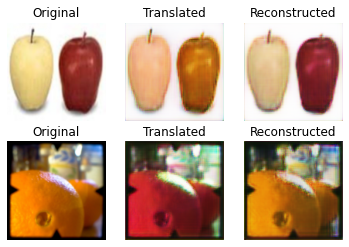

[Epoch 22/100] [Batch 1/15] [D loss: 0.266632, acc:  52%] [G loss: 3.966001, adv: 0.439036, recon: 0.135131, id: 0.203053] time: 0:25:15.675662 
[Epoch 22/100] [Batch 2/15] [D loss: 0.281928, acc:  51%] [G loss: 3.921396, adv: 0.425462, recon: 0.133735, id: 0.196467] time: 0:25:20.396828 
[Epoch 22/100] [Batch 3/15] [D loss: 0.286194, acc:  47%] [G loss: 3.932528, adv: 0.433245, recon: 0.133399, id: 0.216444] time: 0:25:25.107466 
[Epoch 22/100] [Batch 4/15] [D loss: 0.283236, acc:  49%] [G loss: 3.750731, adv: 0.416483, recon: 0.125964, id: 0.210294] time: 0:25:29.784843 
[Epoch 22/100] [Batch 5/15] [D loss: 0.284992, acc:  49%] [G loss: 3.936823, adv: 0.428687, recon: 0.133775, id: 0.206756] time: 0:25:34.476854 
[Epoch 22/100] [Batch 6/15] [D loss: 0.285047, acc:  49%] [G loss: 3.945678, adv: 0.426957, recon: 0.134160, id: 0.208321] time: 0:25:39.155448 
[Epoch 22/100] [Batch 7/15] [D loss: 0.272965, acc:  49%] [G loss: 3.910820, adv: 0.452091, recon: 0.130887, id: 0.219697] time: 0

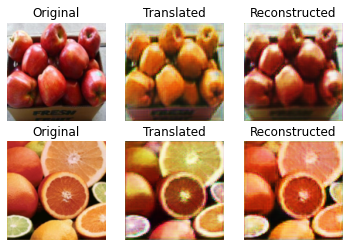

[Epoch 22/100] [Batch 11/15] [D loss: 0.255229, acc:  56%] [G loss: 4.060596, adv: 0.464527, recon: 0.136427, id: 0.215868] time: 0:26:03.050131 
[Epoch 22/100] [Batch 12/15] [D loss: 0.288801, acc:  49%] [G loss: 4.003907, adv: 0.500689, recon: 0.130175, id: 0.214010] time: 0:26:07.760136 
[Epoch 22/100] [Batch 13/15] [D loss: 0.293597, acc:  50%] [G loss: 3.927003, adv: 0.479014, recon: 0.129601, id: 0.208244] time: 0:26:12.448686 
[Epoch 23/100] [Batch 0/15] [D loss: 0.272145, acc:  53%] [G loss: 4.109002, adv: 0.487797, recon: 0.136387, id: 0.214890] time: 0:26:17.151212 


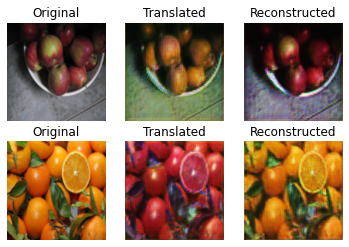

[Epoch 23/100] [Batch 1/15] [D loss: 0.306294, acc:  49%] [G loss: 3.967287, adv: 0.469499, recon: 0.131101, id: 0.219028] time: 0:26:22.249772 
[Epoch 23/100] [Batch 2/15] [D loss: 0.305634, acc:  48%] [G loss: 3.882579, adv: 0.430624, recon: 0.129960, id: 0.225635] time: 0:26:26.942091 
[Epoch 23/100] [Batch 3/15] [D loss: 0.269564, acc:  50%] [G loss: 3.743259, adv: 0.428763, recon: 0.125172, id: 0.199049] time: 0:26:31.598422 
[Epoch 23/100] [Batch 4/15] [D loss: 0.262330, acc:  53%] [G loss: 3.821090, adv: 0.437307, recon: 0.127000, id: 0.217989] time: 0:26:36.286391 
[Epoch 23/100] [Batch 5/15] [D loss: 0.271419, acc:  49%] [G loss: 3.547879, adv: 0.405661, recon: 0.118023, id: 0.205541] time: 0:26:40.950153 
[Epoch 23/100] [Batch 6/15] [D loss: 0.274057, acc:  49%] [G loss: 3.742263, adv: 0.407623, recon: 0.127088, id: 0.199067] time: 0:26:45.652571 
[Epoch 23/100] [Batch 7/15] [D loss: 0.275956, acc:  48%] [G loss: 3.907578, adv: 0.444127, recon: 0.131380, id: 0.207083] time: 0

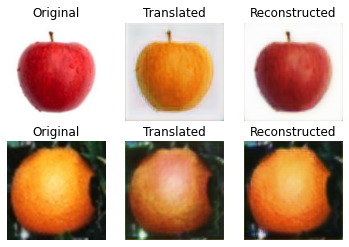

[Epoch 23/100] [Batch 11/15] [D loss: 0.282342, acc:  47%] [G loss: 3.678513, adv: 0.424729, recon: 0.122415, id: 0.209337] time: 0:27:09.502989 
[Epoch 23/100] [Batch 12/15] [D loss: 0.285129, acc:  48%] [G loss: 3.611452, adv: 0.404220, recon: 0.120940, id: 0.202876] time: 0:27:14.225587 
[Epoch 23/100] [Batch 13/15] [D loss: 0.279716, acc:  52%] [G loss: 3.665389, adv: 0.434601, recon: 0.121688, id: 0.189230] time: 0:27:18.910672 
[Epoch 24/100] [Batch 0/15] [D loss: 0.289188, acc:  51%] [G loss: 4.110045, adv: 0.482976, recon: 0.137325, id: 0.213030] time: 0:27:23.584288 


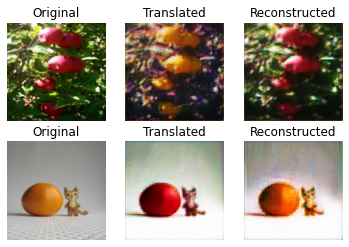

[Epoch 24/100] [Batch 1/15] [D loss: 0.301367, acc:  50%] [G loss: 3.802723, adv: 0.433671, recon: 0.128323, id: 0.198330] time: 0:27:28.704154 
[Epoch 24/100] [Batch 2/15] [D loss: 0.281451, acc:  54%] [G loss: 3.699685, adv: 0.437604, recon: 0.121875, id: 0.215006] time: 0:27:33.406362 
[Epoch 24/100] [Batch 3/15] [D loss: 0.278304, acc:  52%] [G loss: 3.697889, adv: 0.431964, recon: 0.121824, id: 0.215449] time: 0:27:38.107071 
[Epoch 24/100] [Batch 4/15] [D loss: 0.265277, acc:  51%] [G loss: 3.660513, adv: 0.430416, recon: 0.120869, id: 0.206734] time: 0:27:42.802578 
[Epoch 24/100] [Batch 5/15] [D loss: 0.273235, acc:  50%] [G loss: 3.863518, adv: 0.444042, recon: 0.128881, id: 0.208945] time: 0:27:47.500430 
[Epoch 24/100] [Batch 6/15] [D loss: 0.251624, acc:  56%] [G loss: 4.037127, adv: 0.466065, recon: 0.135894, id: 0.197631] time: 0:27:52.224521 
[Epoch 24/100] [Batch 7/15] [D loss: 0.265805, acc:  53%] [G loss: 3.990583, adv: 0.448911, recon: 0.135108, id: 0.210076] time: 0

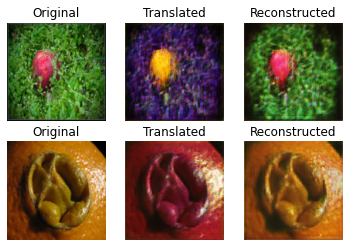

[Epoch 24/100] [Batch 11/15] [D loss: 0.279082, acc:  53%] [G loss: 3.873237, adv: 0.445479, recon: 0.129355, id: 0.193957] time: 0:28:16.170238 
[Epoch 24/100] [Batch 12/15] [D loss: 0.276906, acc:  51%] [G loss: 3.655469, adv: 0.456931, recon: 0.117661, id: 0.216740] time: 0:28:20.875300 
[Epoch 24/100] [Batch 13/15] [D loss: 0.281940, acc:  48%] [G loss: 3.663873, adv: 0.411548, recon: 0.122870, id: 0.208591] time: 0:28:25.574010 
[Epoch 25/100] [Batch 0/15] [D loss: 0.254027, acc:  56%] [G loss: 3.773343, adv: 0.448153, recon: 0.124648, id: 0.199299] time: 0:28:30.266741 


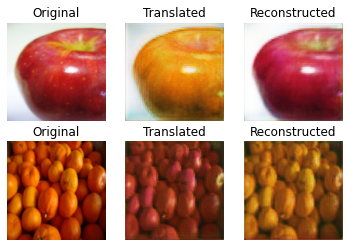

[Epoch 25/100] [Batch 1/15] [D loss: 0.272117, acc:  50%] [G loss: 3.926649, adv: 0.411124, recon: 0.135818, id: 0.206763] time: 0:28:35.419905 
[Epoch 25/100] [Batch 2/15] [D loss: 0.269223, acc:  51%] [G loss: 3.899418, adv: 0.458809, recon: 0.128974, id: 0.219319] time: 0:28:40.154479 
[Epoch 25/100] [Batch 3/15] [D loss: 0.286611, acc:  46%] [G loss: 4.105964, adv: 0.411862, recon: 0.144418, id: 0.215628] time: 0:28:44.865493 
[Epoch 25/100] [Batch 4/15] [D loss: 0.280602, acc:  48%] [G loss: 4.012631, adv: 0.443757, recon: 0.135533, id: 0.222701] time: 0:28:49.600324 
[Epoch 25/100] [Batch 5/15] [D loss: 0.281111, acc:  47%] [G loss: 3.531112, adv: 0.437603, recon: 0.114563, id: 0.187882] time: 0:28:54.319487 
[Epoch 25/100] [Batch 6/15] [D loss: 0.266832, acc:  54%] [G loss: 3.656885, adv: 0.515650, recon: 0.113344, id: 0.185652] time: 0:28:59.033721 
[Epoch 25/100] [Batch 7/15] [D loss: 0.276886, acc:  54%] [G loss: 3.724553, adv: 0.478431, recon: 0.119804, id: 0.180318] time: 0

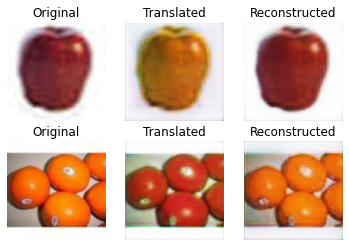

[Epoch 25/100] [Batch 11/15] [D loss: 0.270559, acc:  51%] [G loss: 3.561370, adv: 0.435235, recon: 0.115837, id: 0.206940] time: 0:29:22.966228 
[Epoch 25/100] [Batch 12/15] [D loss: 0.275101, acc:  50%] [G loss: 3.601691, adv: 0.402308, recon: 0.120202, id: 0.202651] time: 0:29:27.673615 
[Epoch 25/100] [Batch 13/15] [D loss: 0.245757, acc:  57%] [G loss: 3.956977, adv: 0.481141, recon: 0.128963, id: 0.222166] time: 0:29:32.382281 
[Epoch 26/100] [Batch 0/15] [D loss: 0.269223, acc:  52%] [G loss: 3.968039, adv: 0.445092, recon: 0.132986, id: 0.229790] time: 0:29:37.082311 


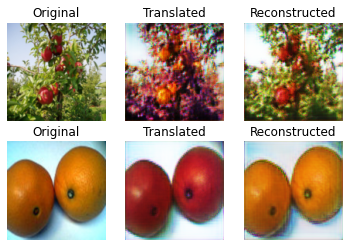

[Epoch 26/100] [Batch 1/15] [D loss: 0.274061, acc:  52%] [G loss: 3.966428, adv: 0.431129, recon: 0.134779, id: 0.223561] time: 0:29:42.193930 
[Epoch 26/100] [Batch 2/15] [D loss: 0.263672, acc:  51%] [G loss: 3.847466, adv: 0.418784, recon: 0.130678, id: 0.220250] time: 0:29:46.904953 
[Epoch 26/100] [Batch 3/15] [D loss: 0.279611, acc:  51%] [G loss: 3.882662, adv: 0.447910, recon: 0.129495, id: 0.210843] time: 0:29:51.626554 
[Epoch 26/100] [Batch 4/15] [D loss: 0.250467, acc:  56%] [G loss: 3.933675, adv: 0.453082, recon: 0.131891, id: 0.220435] time: 0:29:56.334272 
[Epoch 26/100] [Batch 5/15] [D loss: 0.268105, acc:  51%] [G loss: 3.760689, adv: 0.431913, recon: 0.125747, id: 0.195072] time: 0:30:01.021136 
[Epoch 26/100] [Batch 6/15] [D loss: 0.252732, acc:  57%] [G loss: 3.784723, adv: 0.443693, recon: 0.125867, id: 0.205038] time: 0:30:05.776030 
[Epoch 26/100] [Batch 7/15] [D loss: 0.256224, acc:  55%] [G loss: 3.676383, adv: 0.457595, recon: 0.118658, id: 0.203114] time: 0

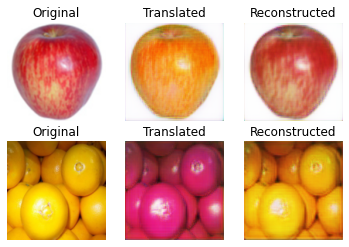

[Epoch 26/100] [Batch 11/15] [D loss: 0.283642, acc:  50%] [G loss: 3.629472, adv: 0.444643, recon: 0.118055, id: 0.198973] time: 0:30:30.073954 
[Epoch 26/100] [Batch 12/15] [D loss: 0.273188, acc:  51%] [G loss: 3.629127, adv: 0.423325, recon: 0.120451, id: 0.194478] time: 0:30:34.782129 
[Epoch 26/100] [Batch 13/15] [D loss: 0.271005, acc:  50%] [G loss: 3.682055, adv: 0.432990, recon: 0.121036, id: 0.208825] time: 0:30:39.471885 
[Epoch 27/100] [Batch 0/15] [D loss: 0.254717, acc:  56%] [G loss: 3.832035, adv: 0.467952, recon: 0.125860, id: 0.191998] time: 0:30:44.166710 


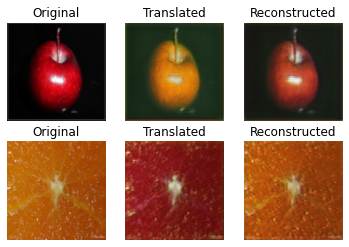

[Epoch 27/100] [Batch 1/15] [D loss: 0.283643, acc:  52%] [G loss: 3.855086, adv: 0.478383, recon: 0.125356, id: 0.211079] time: 0:30:49.313451 
[Epoch 27/100] [Batch 2/15] [D loss: 0.283899, acc:  50%] [G loss: 4.146307, adv: 0.468704, recon: 0.140512, id: 0.210466] time: 0:30:54.043441 
[Epoch 27/100] [Batch 3/15] [D loss: 0.267600, acc:  53%] [G loss: 3.922470, adv: 0.463182, recon: 0.130353, id: 0.211262] time: 0:30:58.758309 
[Epoch 27/100] [Batch 4/15] [D loss: 0.276727, acc:  52%] [G loss: 3.524734, adv: 0.421787, recon: 0.116268, id: 0.181253] time: 0:31:03.455754 
[Epoch 27/100] [Batch 5/15] [D loss: 0.268270, acc:  51%] [G loss: 3.705033, adv: 0.405895, recon: 0.125159, id: 0.214380] time: 0:31:08.168210 
[Epoch 27/100] [Batch 6/15] [D loss: 0.254572, acc:  53%] [G loss: 3.737218, adv: 0.435439, recon: 0.124861, id: 0.181650] time: 0:31:12.872802 
[Epoch 27/100] [Batch 7/15] [D loss: 0.270014, acc:  51%] [G loss: 3.504952, adv: 0.424580, recon: 0.113999, id: 0.203918] time: 0

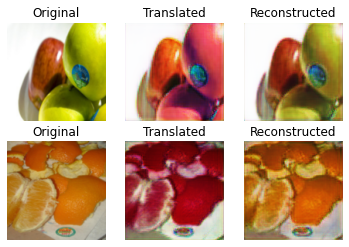

[Epoch 27/100] [Batch 11/15] [D loss: 0.274201, acc:  52%] [G loss: 3.879674, adv: 0.485449, recon: 0.126119, id: 0.209289] time: 0:31:36.892302 
[Epoch 27/100] [Batch 12/15] [D loss: 0.281154, acc:  53%] [G loss: 3.897303, adv: 0.450369, recon: 0.129230, id: 0.222608] time: 0:31:41.603772 
[Epoch 27/100] [Batch 13/15] [D loss: 0.263444, acc:  54%] [G loss: 3.706043, adv: 0.449914, recon: 0.121255, id: 0.191802] time: 0:31:46.322643 
[Epoch 28/100] [Batch 0/15] [D loss: 0.260702, acc:  55%] [G loss: 3.825576, adv: 0.446230, recon: 0.126636, id: 0.215142] time: 0:31:51.047072 


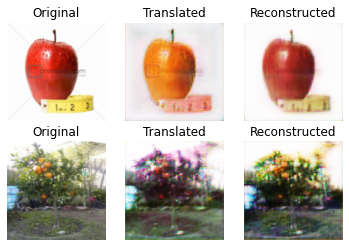

[Epoch 28/100] [Batch 1/15] [D loss: 0.259058, acc:  53%] [G loss: 3.564011, adv: 0.430516, recon: 0.116260, id: 0.203114] time: 0:31:56.213375 
[Epoch 28/100] [Batch 2/15] [D loss: 0.270530, acc:  51%] [G loss: 3.523151, adv: 0.412703, recon: 0.117720, id: 0.164302] time: 0:32:00.914096 
[Epoch 28/100] [Batch 3/15] [D loss: 0.251764, acc:  56%] [G loss: 4.013814, adv: 0.455464, recon: 0.135624, id: 0.213147] time: 0:32:05.614265 
[Epoch 28/100] [Batch 4/15] [D loss: 0.257243, acc:  54%] [G loss: 3.697408, adv: 0.437867, recon: 0.123164, id: 0.175535] time: 0:32:10.342092 
[Epoch 28/100] [Batch 5/15] [D loss: 0.269459, acc:  51%] [G loss: 3.506865, adv: 0.429880, recon: 0.114090, id: 0.192349] time: 0:32:15.080829 
[Epoch 28/100] [Batch 6/15] [D loss: 0.254948, acc:  56%] [G loss: 3.708516, adv: 0.450669, recon: 0.121396, id: 0.199245] time: 0:32:19.824531 
[Epoch 28/100] [Batch 7/15] [D loss: 0.247786, acc:  57%] [G loss: 3.855838, adv: 0.433941, recon: 0.129649, id: 0.208608] time: 0

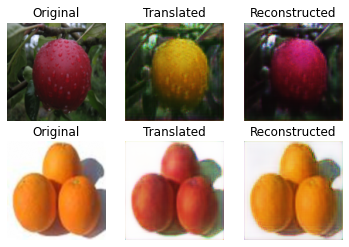

[Epoch 28/100] [Batch 11/15] [D loss: 0.259320, acc:  54%] [G loss: 3.980868, adv: 0.435971, recon: 0.135317, id: 0.231130] time: 0:32:43.872719 
[Epoch 28/100] [Batch 12/15] [D loss: 0.256283, acc:  56%] [G loss: 3.657417, adv: 0.455598, recon: 0.118135, id: 0.208847] time: 0:32:48.571902 
[Epoch 28/100] [Batch 13/15] [D loss: 0.273855, acc:  51%] [G loss: 3.517776, adv: 0.426119, recon: 0.114263, id: 0.198682] time: 0:32:53.285467 
[Epoch 29/100] [Batch 0/15] [D loss: 0.266147, acc:  53%] [G loss: 3.844531, adv: 0.454207, recon: 0.125778, id: 0.225028] time: 0:32:57.983559 


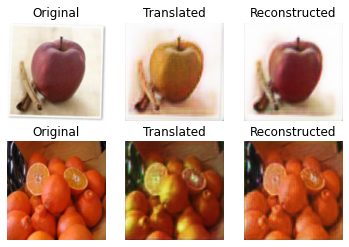

[Epoch 29/100] [Batch 1/15] [D loss: 0.272603, acc:  52%] [G loss: 3.691772, adv: 0.446437, recon: 0.120357, id: 0.211110] time: 0:33:03.138553 
[Epoch 29/100] [Batch 2/15] [D loss: 0.267905, acc:  54%] [G loss: 3.664082, adv: 0.434625, recon: 0.120836, id: 0.202554] time: 0:33:07.849234 
[Epoch 29/100] [Batch 3/15] [D loss: 0.263640, acc:  53%] [G loss: 3.666948, adv: 0.425730, recon: 0.121660, id: 0.206738] time: 0:33:12.529002 
[Epoch 29/100] [Batch 4/15] [D loss: 0.252216, acc:  55%] [G loss: 3.564208, adv: 0.447365, recon: 0.115556, id: 0.183717] time: 0:33:17.218114 
[Epoch 29/100] [Batch 5/15] [D loss: 0.246613, acc:  58%] [G loss: 3.583940, adv: 0.453236, recon: 0.115642, id: 0.189403] time: 0:33:21.942134 
[Epoch 29/100] [Batch 6/15] [D loss: 0.268329, acc:  51%] [G loss: 3.727873, adv: 0.441797, recon: 0.123439, id: 0.199218] time: 0:33:26.652500 
[Epoch 29/100] [Batch 7/15] [D loss: 0.243761, acc:  59%] [G loss: 4.096932, adv: 0.508568, recon: 0.133074, id: 0.220638] time: 0

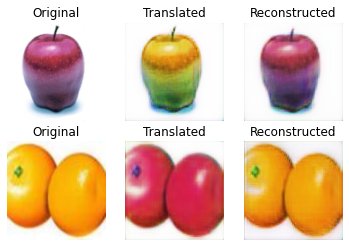

[Epoch 29/100] [Batch 11/15] [D loss: 0.262026, acc:  53%] [G loss: 3.761057, adv: 0.416004, recon: 0.127228, id: 0.210313] time: 0:33:50.572945 
[Epoch 29/100] [Batch 12/15] [D loss: 0.256911, acc:  55%] [G loss: 3.736631, adv: 0.464848, recon: 0.120853, id: 0.208780] time: 0:33:55.280651 
[Epoch 29/100] [Batch 13/15] [D loss: 0.256519, acc:  55%] [G loss: 3.537155, adv: 0.444581, recon: 0.113058, id: 0.213265] time: 0:34:00.003920 
[Epoch 30/100] [Batch 0/15] [D loss: 0.275319, acc:  50%] [G loss: 3.764803, adv: 0.411859, recon: 0.127720, id: 0.213555] time: 0:34:04.759282 


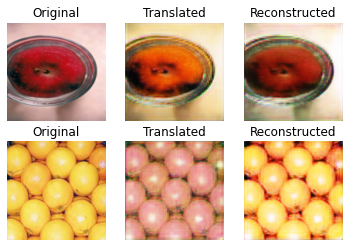

[Epoch 30/100] [Batch 1/15] [D loss: 0.266287, acc:  53%] [G loss: 3.810905, adv: 0.455314, recon: 0.125160, id: 0.212855] time: 0:34:09.920907 
[Epoch 30/100] [Batch 2/15] [D loss: 0.262154, acc:  53%] [G loss: 3.687670, adv: 0.449424, recon: 0.120274, id: 0.207319] time: 0:34:14.666917 
[Epoch 30/100] [Batch 3/15] [D loss: 0.259113, acc:  55%] [G loss: 3.532191, adv: 0.440699, recon: 0.114522, id: 0.190244] time: 0:34:19.364415 
[Epoch 30/100] [Batch 4/15] [D loss: 0.251778, acc:  56%] [G loss: 3.685527, adv: 0.454466, recon: 0.120190, id: 0.186712] time: 0:34:24.096880 
[Epoch 30/100] [Batch 5/15] [D loss: 0.263556, acc:  52%] [G loss: 3.927588, adv: 0.452759, recon: 0.132374, id: 0.200176] time: 0:34:28.811201 
[Epoch 30/100] [Batch 6/15] [D loss: 0.250480, acc:  57%] [G loss: 3.831397, adv: 0.452025, recon: 0.128053, id: 0.181796] time: 0:34:33.489413 
[Epoch 30/100] [Batch 7/15] [D loss: 0.276599, acc:  50%] [G loss: 3.777299, adv: 0.477872, recon: 0.122331, id: 0.188437] time: 0

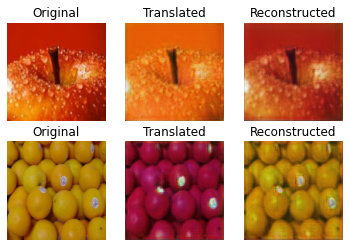

[Epoch 30/100] [Batch 11/15] [D loss: 0.259468, acc:  54%] [G loss: 3.637846, adv: 0.443752, recon: 0.118661, id: 0.199617] time: 0:34:57.399955 
[Epoch 30/100] [Batch 12/15] [D loss: 0.260397, acc:  55%] [G loss: 3.853604, adv: 0.466916, recon: 0.126024, id: 0.213054] time: 0:35:02.109404 
[Epoch 30/100] [Batch 13/15] [D loss: 0.280377, acc:  49%] [G loss: 3.749269, adv: 0.438664, recon: 0.125249, id: 0.195792] time: 0:35:06.830890 
[Epoch 31/100] [Batch 0/15] [D loss: 0.242016, acc:  58%] [G loss: 3.545805, adv: 0.465565, recon: 0.113085, id: 0.178434] time: 0:35:11.522332 


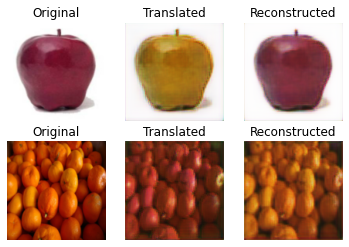

[Epoch 31/100] [Batch 1/15] [D loss: 0.267970, acc:  54%] [G loss: 3.652567, adv: 0.451396, recon: 0.118460, id: 0.194432] time: 0:35:16.667563 
[Epoch 31/100] [Batch 2/15] [D loss: 0.259278, acc:  54%] [G loss: 3.547858, adv: 0.429762, recon: 0.115582, id: 0.186378] time: 0:35:21.344653 
[Epoch 31/100] [Batch 3/15] [D loss: 0.246102, acc:  58%] [G loss: 3.769670, adv: 0.448252, recon: 0.124250, id: 0.219426] time: 0:35:26.056469 
[Epoch 31/100] [Batch 4/15] [D loss: 0.268738, acc:  53%] [G loss: 3.826859, adv: 0.451705, recon: 0.127356, id: 0.186425] time: 0:35:30.780855 
[Epoch 31/100] [Batch 5/15] [D loss: 0.256574, acc:  54%] [G loss: 3.826687, adv: 0.448769, recon: 0.127850, id: 0.205871] time: 0:35:35.466704 
[Epoch 31/100] [Batch 6/15] [D loss: 0.261446, acc:  54%] [G loss: 3.683308, adv: 0.426945, recon: 0.122641, id: 0.200165] time: 0:35:40.171510 
[Epoch 31/100] [Batch 7/15] [D loss: 0.267208, acc:  54%] [G loss: 3.612042, adv: 0.430806, recon: 0.118676, id: 0.201228] time: 0

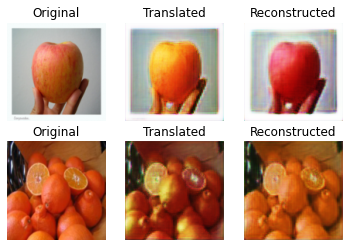

[Epoch 31/100] [Batch 11/15] [D loss: 0.287543, acc:  51%] [G loss: 3.654344, adv: 0.466105, recon: 0.118302, id: 0.187325] time: 0:36:03.959713 
[Epoch 31/100] [Batch 12/15] [D loss: 0.277547, acc:  55%] [G loss: 3.780643, adv: 0.531909, recon: 0.116900, id: 0.193094] time: 0:36:08.621707 
[Epoch 31/100] [Batch 13/15] [D loss: 0.281591, acc:  53%] [G loss: 3.942987, adv: 0.442539, recon: 0.132997, id: 0.217437] time: 0:36:13.298753 
[Epoch 32/100] [Batch 0/15] [D loss: 0.259473, acc:  54%] [G loss: 3.748106, adv: 0.439437, recon: 0.124587, id: 0.192967] time: 0:36:17.982436 


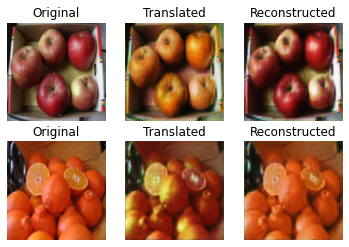

[Epoch 32/100] [Batch 1/15] [D loss: 0.265580, acc:  54%] [G loss: 3.719612, adv: 0.436623, recon: 0.122430, id: 0.215165] time: 0:36:23.082189 
[Epoch 32/100] [Batch 2/15] [D loss: 0.258562, acc:  55%] [G loss: 3.694500, adv: 0.436276, recon: 0.121868, id: 0.205463] time: 0:36:27.753824 
[Epoch 32/100] [Batch 3/15] [D loss: 0.248959, acc:  57%] [G loss: 3.635074, adv: 0.456238, recon: 0.116447, id: 0.214925] time: 0:36:32.442067 
[Epoch 32/100] [Batch 4/15] [D loss: 0.268971, acc:  53%] [G loss: 3.619951, adv: 0.431091, recon: 0.119912, id: 0.185334] time: 0:36:37.081147 
[Epoch 32/100] [Batch 5/15] [D loss: 0.247238, acc:  57%] [G loss: 3.678288, adv: 0.456988, recon: 0.119564, id: 0.195145] time: 0:36:41.753721 
[Epoch 32/100] [Batch 6/15] [D loss: 0.250892, acc:  57%] [G loss: 3.603215, adv: 0.442221, recon: 0.117344, id: 0.200308] time: 0:36:46.456737 
[Epoch 32/100] [Batch 7/15] [D loss: 0.261608, acc:  55%] [G loss: 3.601288, adv: 0.473461, recon: 0.114764, id: 0.187590] time: 0

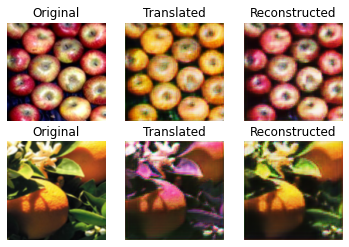

[Epoch 32/100] [Batch 11/15] [D loss: 0.256973, acc:  55%] [G loss: 3.520510, adv: 0.458601, recon: 0.112424, id: 0.192608] time: 0:37:10.581397 
[Epoch 32/100] [Batch 12/15] [D loss: 0.270768, acc:  52%] [G loss: 3.590429, adv: 0.497421, recon: 0.110966, id: 0.198330] time: 0:37:15.309928 
[Epoch 32/100] [Batch 13/15] [D loss: 0.247070, acc:  58%] [G loss: 3.655145, adv: 0.471772, recon: 0.116840, id: 0.201282] time: 0:37:19.990483 
[Epoch 33/100] [Batch 0/15] [D loss: 0.273697, acc:  55%] [G loss: 3.629670, adv: 0.464070, recon: 0.116208, id: 0.193839] time: 0:37:24.684757 


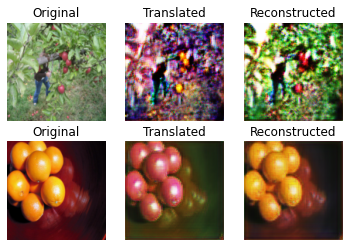

[Epoch 33/100] [Batch 1/15] [D loss: 0.271535, acc:  54%] [G loss: 3.557541, adv: 0.462054, recon: 0.112646, id: 0.199384] time: 0:37:29.745343 
[Epoch 33/100] [Batch 2/15] [D loss: 0.249941, acc:  57%] [G loss: 3.517448, adv: 0.433563, recon: 0.113342, id: 0.196871] time: 0:37:34.428102 
[Epoch 33/100] [Batch 3/15] [D loss: 0.258276, acc:  53%] [G loss: 3.749012, adv: 0.433702, recon: 0.124713, id: 0.207391] time: 0:37:39.090811 
[Epoch 33/100] [Batch 4/15] [D loss: 0.285122, acc:  51%] [G loss: 3.864611, adv: 0.464616, recon: 0.127464, id: 0.195449] time: 0:37:43.804447 
[Epoch 33/100] [Batch 5/15] [D loss: 0.245185, acc:  58%] [G loss: 3.707901, adv: 0.459166, recon: 0.120007, id: 0.205015] time: 0:37:48.462845 
[Epoch 33/100] [Batch 6/15] [D loss: 0.271973, acc:  54%] [G loss: 4.055347, adv: 0.575976, recon: 0.125814, id: 0.201316] time: 0:37:53.139115 
[Epoch 33/100] [Batch 7/15] [D loss: 0.283542, acc:  53%] [G loss: 4.072437, adv: 0.540289, recon: 0.129763, id: 0.230052] time: 0

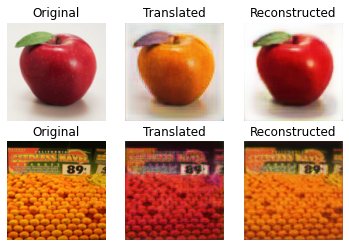

[Epoch 33/100] [Batch 11/15] [D loss: 0.250607, acc:  57%] [G loss: 3.776139, adv: 0.468010, recon: 0.122901, id: 0.196784] time: 0:38:16.945765 
[Epoch 33/100] [Batch 12/15] [D loss: 0.253316, acc:  56%] [G loss: 3.688847, adv: 0.493426, recon: 0.116108, id: 0.197369] time: 0:38:21.641609 
[Epoch 33/100] [Batch 13/15] [D loss: 0.250003, acc:  58%] [G loss: 3.617810, adv: 0.492912, recon: 0.113960, id: 0.183358] time: 0:38:26.294912 
[Epoch 34/100] [Batch 0/15] [D loss: 0.281002, acc:  53%] [G loss: 3.753832, adv: 0.464749, recon: 0.122305, id: 0.204964] time: 0:38:30.970829 


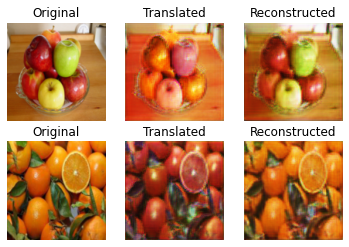

[Epoch 34/100] [Batch 1/15] [D loss: 0.257217, acc:  55%] [G loss: 3.747211, adv: 0.472683, recon: 0.120782, id: 0.205183] time: 0:38:36.058212 
[Epoch 34/100] [Batch 2/15] [D loss: 0.269338, acc:  52%] [G loss: 3.885780, adv: 0.460924, recon: 0.128858, id: 0.206285] time: 0:38:40.713365 
[Epoch 34/100] [Batch 3/15] [D loss: 0.242522, acc:  58%] [G loss: 3.734851, adv: 0.439966, recon: 0.123329, id: 0.206720] time: 0:38:45.373157 
[Epoch 34/100] [Batch 4/15] [D loss: 0.276032, acc:  51%] [G loss: 3.545085, adv: 0.438876, recon: 0.114338, id: 0.207153] time: 0:38:50.090903 
[Epoch 34/100] [Batch 5/15] [D loss: 0.251600, acc:  57%] [G loss: 3.733304, adv: 0.444835, recon: 0.123143, id: 0.193645] time: 0:38:54.798181 
[Epoch 34/100] [Batch 6/15] [D loss: 0.255930, acc:  55%] [G loss: 3.737485, adv: 0.443538, recon: 0.123948, id: 0.200752] time: 0:38:59.459669 
[Epoch 34/100] [Batch 7/15] [D loss: 0.254890, acc:  55%] [G loss: 3.455991, adv: 0.429808, recon: 0.111812, id: 0.182550] time: 0

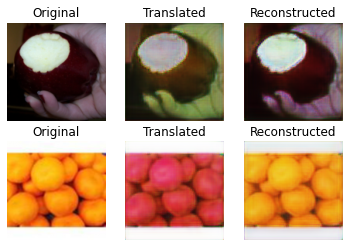

[Epoch 34/100] [Batch 11/15] [D loss: 0.248885, acc:  58%] [G loss: 3.691887, adv: 0.451752, recon: 0.120897, id: 0.184244] time: 0:39:23.421871 
[Epoch 34/100] [Batch 12/15] [D loss: 0.255437, acc:  55%] [G loss: 3.667912, adv: 0.443469, recon: 0.120190, id: 0.207665] time: 0:39:28.100078 
[Epoch 34/100] [Batch 13/15] [D loss: 0.260435, acc:  55%] [G loss: 3.839700, adv: 0.450059, recon: 0.127231, id: 0.217614] time: 0:39:32.810723 
[Epoch 35/100] [Batch 0/15] [D loss: 0.246658, acc:  58%] [G loss: 3.335516, adv: 0.433788, recon: 0.104966, id: 0.195240] time: 0:39:37.523091 


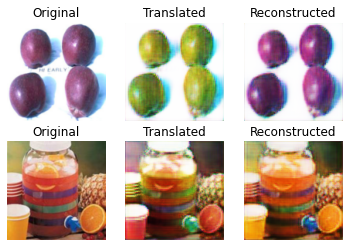

[Epoch 35/100] [Batch 1/15] [D loss: 0.244356, acc:  58%] [G loss: 3.611218, adv: 0.448376, recon: 0.117284, id: 0.186355] time: 0:39:42.681396 
[Epoch 35/100] [Batch 2/15] [D loss: 0.245818, acc:  57%] [G loss: 3.760137, adv: 0.465339, recon: 0.122545, id: 0.188566] time: 0:39:47.389052 
[Epoch 35/100] [Batch 3/15] [D loss: 0.257362, acc:  55%] [G loss: 3.686158, adv: 0.446392, recon: 0.121745, id: 0.192719] time: 0:39:52.098309 
[Epoch 35/100] [Batch 4/15] [D loss: 0.252586, acc:  59%] [G loss: 3.523383, adv: 0.474724, recon: 0.110891, id: 0.184834] time: 0:39:56.825931 
[Epoch 35/100] [Batch 5/15] [D loss: 0.261823, acc:  56%] [G loss: 3.493225, adv: 0.453874, recon: 0.111597, id: 0.190657] time: 0:40:01.492546 
[Epoch 35/100] [Batch 6/15] [D loss: 0.281385, acc:  54%] [G loss: 3.813118, adv: 0.477251, recon: 0.123613, id: 0.198951] time: 0:40:06.223146 
[Epoch 35/100] [Batch 7/15] [D loss: 0.276008, acc:  52%] [G loss: 3.526822, adv: 0.411820, recon: 0.116931, id: 0.189603] time: 0

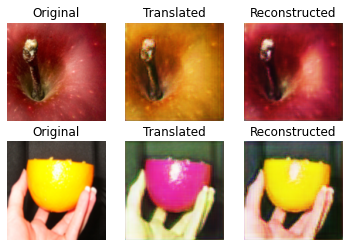

[Epoch 35/100] [Batch 11/15] [D loss: 0.256048, acc:  55%] [G loss: 3.561495, adv: 0.436589, recon: 0.115849, id: 0.199079] time: 0:40:30.086715 
[Epoch 35/100] [Batch 12/15] [D loss: 0.266227, acc:  53%] [G loss: 3.822559, adv: 0.458911, recon: 0.126317, id: 0.201643] time: 0:40:34.799585 
[Epoch 35/100] [Batch 13/15] [D loss: 0.258990, acc:  57%] [G loss: 3.963001, adv: 0.471271, recon: 0.131360, id: 0.199172] time: 0:40:39.504517 
[Epoch 36/100] [Batch 0/15] [D loss: 0.271545, acc:  53%] [G loss: 3.630264, adv: 0.459987, recon: 0.117367, id: 0.194315] time: 0:40:44.249930 


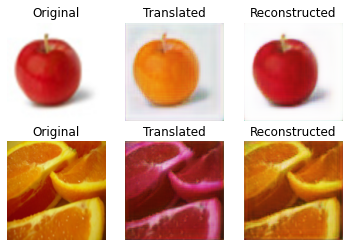

[Epoch 36/100] [Batch 1/15] [D loss: 0.262108, acc:  55%] [G loss: 3.608495, adv: 0.470390, recon: 0.114457, id: 0.206878] time: 0:40:49.366801 
[Epoch 36/100] [Batch 2/15] [D loss: 0.269204, acc:  54%] [G loss: 3.484813, adv: 0.448960, recon: 0.111404, id: 0.182786] time: 0:40:54.080007 
[Epoch 36/100] [Batch 3/15] [D loss: 0.275454, acc:  51%] [G loss: 3.651480, adv: 0.428010, recon: 0.120599, id: 0.209920] time: 0:40:58.754596 
[Epoch 36/100] [Batch 4/15] [D loss: 0.256311, acc:  57%] [G loss: 3.787043, adv: 0.473801, recon: 0.122540, id: 0.204713] time: 0:41:03.430748 
[Epoch 36/100] [Batch 5/15] [D loss: 0.246374, acc:  57%] [G loss: 3.620011, adv: 0.471629, recon: 0.115107, id: 0.201738] time: 0:41:08.157146 
[Epoch 36/100] [Batch 6/15] [D loss: 0.272271, acc:  54%] [G loss: 3.508347, adv: 0.465947, recon: 0.109912, id: 0.195279] time: 0:41:12.904879 
[Epoch 36/100] [Batch 7/15] [D loss: 0.257821, acc:  55%] [G loss: 3.413830, adv: 0.443735, recon: 0.107637, id: 0.199085] time: 0

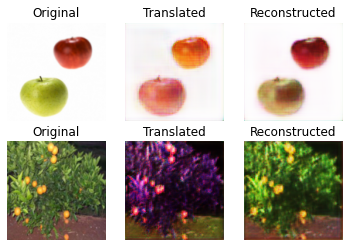

[Epoch 36/100] [Batch 11/15] [D loss: 0.253927, acc:  55%] [G loss: 3.498033, adv: 0.435034, recon: 0.112771, id: 0.189976] time: 0:41:37.158301 
[Epoch 36/100] [Batch 12/15] [D loss: 0.254422, acc:  57%] [G loss: 3.471078, adv: 0.445609, recon: 0.111427, id: 0.177340] time: 0:41:41.873184 
[Epoch 36/100] [Batch 13/15] [D loss: 0.250102, acc:  57%] [G loss: 3.621459, adv: 0.451082, recon: 0.118861, id: 0.175723] time: 0:41:46.587452 
[Epoch 37/100] [Batch 0/15] [D loss: 0.253262, acc:  56%] [G loss: 3.911071, adv: 0.451273, recon: 0.131380, id: 0.194505] time: 0:41:51.301346 


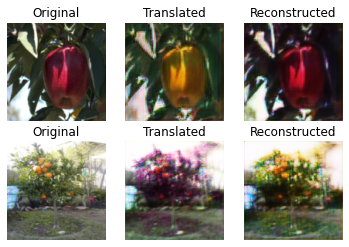

[Epoch 37/100] [Batch 1/15] [D loss: 0.271408, acc:  53%] [G loss: 3.782151, adv: 0.520138, recon: 0.119154, id: 0.175100] time: 0:41:56.492221 
[Epoch 37/100] [Batch 2/15] [D loss: 0.281119, acc:  55%] [G loss: 3.315863, adv: 0.432726, recon: 0.104354, id: 0.193261] time: 0:42:01.211749 
[Epoch 37/100] [Batch 3/15] [D loss: 0.261224, acc:  56%] [G loss: 3.532492, adv: 0.475838, recon: 0.111867, id: 0.163351] time: 0:42:05.932998 
[Epoch 37/100] [Batch 4/15] [D loss: 0.270348, acc:  54%] [G loss: 3.589072, adv: 0.460290, recon: 0.115652, id: 0.193819] time: 0:42:10.707849 
[Epoch 37/100] [Batch 5/15] [D loss: 0.275056, acc:  53%] [G loss: 3.745779, adv: 0.453195, recon: 0.123881, id: 0.187253] time: 0:42:15.440420 
[Epoch 37/100] [Batch 6/15] [D loss: 0.269926, acc:  54%] [G loss: 3.470240, adv: 0.431721, recon: 0.112517, id: 0.182048] time: 0:42:20.197640 
[Epoch 37/100] [Batch 7/15] [D loss: 0.254813, acc:  56%] [G loss: 3.596851, adv: 0.456924, recon: 0.115613, id: 0.195609] time: 0

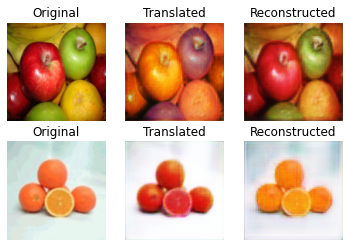

[Epoch 37/100] [Batch 11/15] [D loss: 0.244825, acc:  58%] [G loss: 3.722554, adv: 0.466387, recon: 0.121327, id: 0.183825] time: 0:42:44.373818 
[Epoch 37/100] [Batch 12/15] [D loss: 0.296135, acc:  51%] [G loss: 3.605131, adv: 0.491783, recon: 0.112517, id: 0.200616] time: 0:42:49.110116 
[Epoch 37/100] [Batch 13/15] [D loss: 0.286453, acc:  53%] [G loss: 3.458668, adv: 0.429830, recon: 0.112826, id: 0.180400] time: 0:42:53.869887 
[Epoch 38/100] [Batch 0/15] [D loss: 0.273602, acc:  52%] [G loss: 3.556366, adv: 0.465162, recon: 0.112768, id: 0.192478] time: 0:42:58.624617 


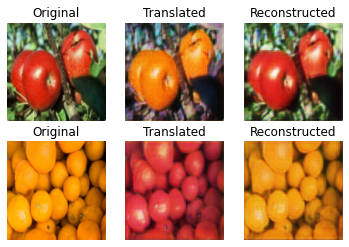

[Epoch 38/100] [Batch 1/15] [D loss: 0.259319, acc:  55%] [G loss: 3.373497, adv: 0.422866, recon: 0.109067, id: 0.175215] time: 0:43:03.875607 
[Epoch 38/100] [Batch 2/15] [D loss: 0.261350, acc:  55%] [G loss: 3.648294, adv: 0.472667, recon: 0.116194, id: 0.198632] time: 0:43:08.619007 
[Epoch 38/100] [Batch 3/15] [D loss: 0.254288, acc:  56%] [G loss: 3.548295, adv: 0.473313, recon: 0.111777, id: 0.189058] time: 0:43:13.347309 
[Epoch 38/100] [Batch 4/15] [D loss: 0.263937, acc:  54%] [G loss: 3.570005, adv: 0.438463, recon: 0.115802, id: 0.206320] time: 0:43:18.115003 
[Epoch 38/100] [Batch 5/15] [D loss: 0.257376, acc:  56%] [G loss: 3.492710, adv: 0.518306, recon: 0.106096, id: 0.168533] time: 0:43:22.849118 
[Epoch 38/100] [Batch 6/15] [D loss: 0.279591, acc:  53%] [G loss: 3.341190, adv: 0.417655, recon: 0.107653, id: 0.178379] time: 0:43:27.593819 
[Epoch 38/100] [Batch 7/15] [D loss: 0.253316, acc:  56%] [G loss: 3.394149, adv: 0.426397, recon: 0.108960, id: 0.189781] time: 0

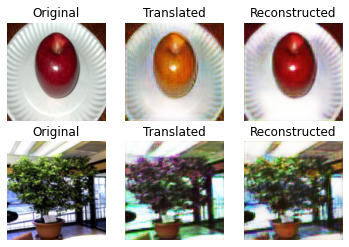

[Epoch 38/100] [Batch 11/15] [D loss: 0.249800, acc:  57%] [G loss: 3.565632, adv: 0.466075, recon: 0.113836, id: 0.180410] time: 0:43:52.034498 
[Epoch 38/100] [Batch 12/15] [D loss: 0.267391, acc:  55%] [G loss: 3.597133, adv: 0.443601, recon: 0.116963, id: 0.200966] time: 0:43:56.801761 
[Epoch 38/100] [Batch 13/15] [D loss: 0.264392, acc:  53%] [G loss: 3.754525, adv: 0.457579, recon: 0.122688, id: 0.189547] time: 0:44:01.550280 
[Epoch 39/100] [Batch 0/15] [D loss: 0.264889, acc:  55%] [G loss: 3.847316, adv: 0.472889, recon: 0.126649, id: 0.187858] time: 0:44:06.311428 


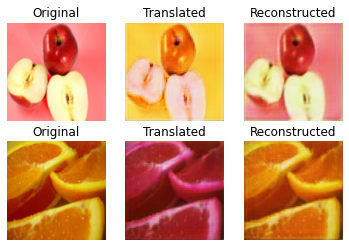

[Epoch 39/100] [Batch 1/15] [D loss: 0.271373, acc:  56%] [G loss: 3.327406, adv: 0.429670, recon: 0.106117, id: 0.170267] time: 0:44:11.517833 
[Epoch 39/100] [Batch 2/15] [D loss: 0.250124, acc:  57%] [G loss: 3.482205, adv: 0.429160, recon: 0.111762, id: 0.210106] time: 0:44:16.286947 
[Epoch 39/100] [Batch 3/15] [D loss: 0.261748, acc:  53%] [G loss: 3.518495, adv: 0.431153, recon: 0.114688, id: 0.189390] time: 0:44:21.024476 
[Epoch 39/100] [Batch 4/15] [D loss: 0.258215, acc:  53%] [G loss: 3.593241, adv: 0.437524, recon: 0.118258, id: 0.182728] time: 0:44:25.752654 
[Epoch 39/100] [Batch 5/15] [D loss: 0.266052, acc:  56%] [G loss: 3.373115, adv: 0.443346, recon: 0.106558, id: 0.188848] time: 0:44:30.474492 
[Epoch 39/100] [Batch 6/15] [D loss: 0.242000, acc:  57%] [G loss: 3.636227, adv: 0.450335, recon: 0.118799, id: 0.193390] time: 0:44:35.237103 
[Epoch 39/100] [Batch 7/15] [D loss: 0.248428, acc:  57%] [G loss: 3.450634, adv: 0.433368, recon: 0.111270, id: 0.176121] time: 0

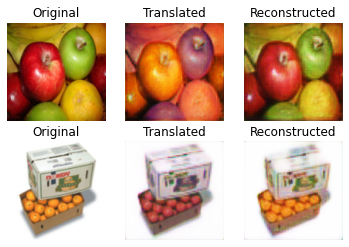

[Epoch 39/100] [Batch 11/15] [D loss: 0.251500, acc:  58%] [G loss: 3.403763, adv: 0.463430, recon: 0.105751, id: 0.185983] time: 0:44:59.384472 
[Epoch 39/100] [Batch 12/15] [D loss: 0.257637, acc:  55%] [G loss: 3.218829, adv: 0.424862, recon: 0.101233, id: 0.167715] time: 0:45:04.095545 
[Epoch 39/100] [Batch 13/15] [D loss: 0.261441, acc:  56%] [G loss: 3.404951, adv: 0.466551, recon: 0.105283, id: 0.181854] time: 0:45:08.807103 
[Epoch 40/100] [Batch 0/15] [D loss: 0.257931, acc:  59%] [G loss: 3.551909, adv: 0.453872, recon: 0.113934, id: 0.187113] time: 0:45:13.544063 


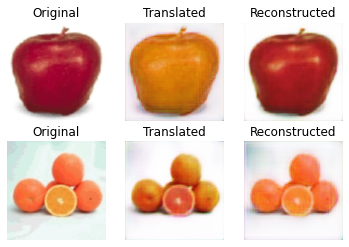

[Epoch 40/100] [Batch 1/15] [D loss: 0.263624, acc:  55%] [G loss: 3.530316, adv: 0.448608, recon: 0.113247, id: 0.192700] time: 0:45:18.743467 
[Epoch 40/100] [Batch 2/15] [D loss: 0.254722, acc:  56%] [G loss: 3.678347, adv: 0.464926, recon: 0.119059, id: 0.190003] time: 0:45:23.478570 
[Epoch 40/100] [Batch 3/15] [D loss: 0.257420, acc:  55%] [G loss: 3.452562, adv: 0.459101, recon: 0.109759, id: 0.167676] time: 0:45:28.222053 
[Epoch 40/100] [Batch 4/15] [D loss: 0.261936, acc:  56%] [G loss: 3.496890, adv: 0.463960, recon: 0.110600, id: 0.179152] time: 0:45:32.981162 
[Epoch 40/100] [Batch 5/15] [D loss: 0.244270, acc:  58%] [G loss: 3.493650, adv: 0.435815, recon: 0.114148, id: 0.164965] time: 0:45:37.706233 
[Epoch 40/100] [Batch 6/15] [D loss: 0.257265, acc:  54%] [G loss: 3.507668, adv: 0.447379, recon: 0.112093, id: 0.192839] time: 0:45:42.456744 
[Epoch 40/100] [Batch 7/15] [D loss: 0.270461, acc:  53%] [G loss: 3.670136, adv: 0.437303, recon: 0.121470, id: 0.190926] time: 0

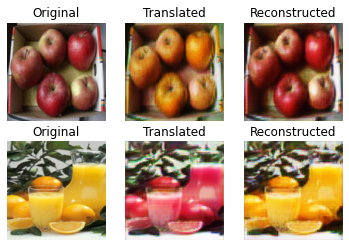

[Epoch 40/100] [Batch 11/15] [D loss: 0.270303, acc:  53%] [G loss: 3.537015, adv: 0.480465, recon: 0.110841, id: 0.184475] time: 0:46:06.610558 
[Epoch 40/100] [Batch 12/15] [D loss: 0.260375, acc:  55%] [G loss: 3.541592, adv: 0.417816, recon: 0.116374, id: 0.211422] time: 0:46:11.357373 
[Epoch 40/100] [Batch 13/15] [D loss: 0.245357, acc:  58%] [G loss: 3.563809, adv: 0.440586, recon: 0.115230, id: 0.193253] time: 0:46:16.121515 
[Epoch 41/100] [Batch 0/15] [D loss: 0.262385, acc:  53%] [G loss: 3.455958, adv: 0.428836, recon: 0.112197, id: 0.189496] time: 0:46:20.885637 


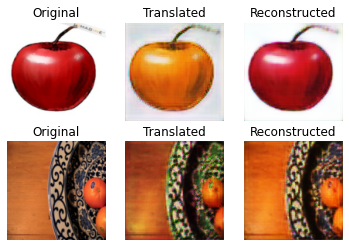

[Epoch 41/100] [Batch 1/15] [D loss: 0.262636, acc:  55%] [G loss: 3.433349, adv: 0.471684, recon: 0.106907, id: 0.183370] time: 0:46:26.086540 
[Epoch 41/100] [Batch 2/15] [D loss: 0.281185, acc:  53%] [G loss: 3.628839, adv: 0.485056, recon: 0.113940, id: 0.211594] time: 0:46:30.832419 
[Epoch 41/100] [Batch 3/15] [D loss: 0.260047, acc:  53%] [G loss: 3.532284, adv: 0.436805, recon: 0.114785, id: 0.182574] time: 0:46:35.599457 
[Epoch 41/100] [Batch 4/15] [D loss: 0.271325, acc:  53%] [G loss: 3.414957, adv: 0.451495, recon: 0.107612, id: 0.188145] time: 0:46:40.388002 
[Epoch 41/100] [Batch 5/15] [D loss: 0.253460, acc:  56%] [G loss: 3.632610, adv: 0.457720, recon: 0.117527, id: 0.186710] time: 0:46:45.154304 
[Epoch 41/100] [Batch 6/15] [D loss: 0.267976, acc:  54%] [G loss: 3.491593, adv: 0.411947, recon: 0.115453, id: 0.188731] time: 0:46:49.921538 
[Epoch 41/100] [Batch 7/15] [D loss: 0.257562, acc:  54%] [G loss: 3.537222, adv: 0.424923, recon: 0.116201, id: 0.189456] time: 0

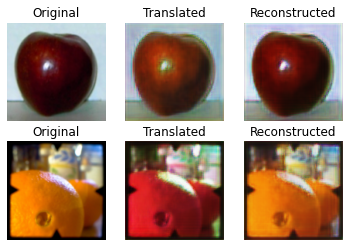

[Epoch 41/100] [Batch 11/15] [D loss: 0.252962, acc:  56%] [G loss: 3.550668, adv: 0.462667, recon: 0.113226, id: 0.191328] time: 0:47:14.241408 
[Epoch 41/100] [Batch 12/15] [D loss: 0.275808, acc:  50%] [G loss: 3.345874, adv: 0.411688, recon: 0.107944, id: 0.189911] time: 0:47:19.005206 
[Epoch 41/100] [Batch 13/15] [D loss: 0.269625, acc:  54%] [G loss: 3.440987, adv: 0.443204, recon: 0.109619, id: 0.176418] time: 0:47:23.766884 
[Epoch 42/100] [Batch 0/15] [D loss: 0.259607, acc:  54%] [G loss: 3.485802, adv: 0.431453, recon: 0.114013, id: 0.175428] time: 0:47:28.553838 


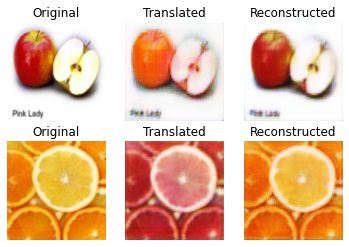

[Epoch 42/100] [Batch 1/15] [D loss: 0.250365, acc:  57%] [G loss: 3.240424, adv: 0.428700, recon: 0.102203, id: 0.169055] time: 0:47:33.800076 
[Epoch 42/100] [Batch 2/15] [D loss: 0.265601, acc:  51%] [G loss: 3.488339, adv: 0.415781, recon: 0.114909, id: 0.190011] time: 0:47:38.564459 
[Epoch 42/100] [Batch 3/15] [D loss: 0.255330, acc:  56%] [G loss: 3.525094, adv: 0.452497, recon: 0.113395, id: 0.176129] time: 0:47:43.344418 
[Epoch 42/100] [Batch 4/15] [D loss: 0.250349, acc:  55%] [G loss: 3.691531, adv: 0.428603, recon: 0.123599, id: 0.190331] time: 0:47:48.147274 
[Epoch 42/100] [Batch 5/15] [D loss: 0.275209, acc:  52%] [G loss: 3.414614, adv: 0.422644, recon: 0.110808, id: 0.179864] time: 0:47:52.949918 
[Epoch 42/100] [Batch 6/15] [D loss: 0.244429, acc:  57%] [G loss: 3.430236, adv: 0.443365, recon: 0.108190, id: 0.202032] time: 0:47:57.734656 
[Epoch 42/100] [Batch 7/15] [D loss: 0.244058, acc:  59%] [G loss: 3.369818, adv: 0.435713, recon: 0.106944, id: 0.175025] time: 0

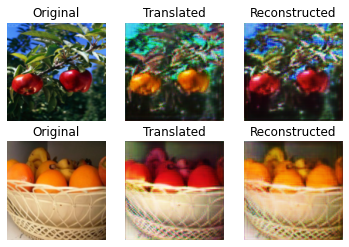

[Epoch 42/100] [Batch 11/15] [D loss: 0.264538, acc:  54%] [G loss: 3.548632, adv: 0.430626, recon: 0.116861, id: 0.163760] time: 0:48:22.143488 
[Epoch 42/100] [Batch 12/15] [D loss: 0.245294, acc:  61%] [G loss: 3.671262, adv: 0.448074, recon: 0.120545, id: 0.182034] time: 0:48:26.945419 
[Epoch 42/100] [Batch 13/15] [D loss: 0.249010, acc:  56%] [G loss: 3.406205, adv: 0.430174, recon: 0.110153, id: 0.172264] time: 0:48:31.750252 
[Epoch 43/100] [Batch 0/15] [D loss: 0.245156, acc:  59%] [G loss: 3.525406, adv: 0.488037, recon: 0.108707, id: 0.197748] time: 0:48:36.572459 


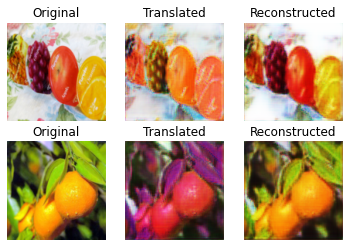

[Epoch 43/100] [Batch 1/15] [D loss: 0.253551, acc:  58%] [G loss: 3.353461, adv: 0.458381, recon: 0.104497, id: 0.171168] time: 0:48:41.835179 
[Epoch 43/100] [Batch 2/15] [D loss: 0.253333, acc:  56%] [G loss: 3.596920, adv: 0.434708, recon: 0.118130, id: 0.189088] time: 0:48:46.633994 
[Epoch 43/100] [Batch 3/15] [D loss: 0.261683, acc:  53%] [G loss: 3.593840, adv: 0.452820, recon: 0.115312, id: 0.195451] time: 0:48:51.440226 
[Epoch 43/100] [Batch 4/15] [D loss: 0.265907, acc:  54%] [G loss: 3.624397, adv: 0.505359, recon: 0.113859, id: 0.174551] time: 0:48:56.259037 
[Epoch 43/100] [Batch 5/15] [D loss: 0.267217, acc:  54%] [G loss: 3.323386, adv: 0.449023, recon: 0.104865, id: 0.157596] time: 0:49:01.066310 
[Epoch 43/100] [Batch 6/15] [D loss: 0.274219, acc:  54%] [G loss: 3.365417, adv: 0.447830, recon: 0.105750, id: 0.184283] time: 0:49:05.875453 
[Epoch 43/100] [Batch 7/15] [D loss: 0.255873, acc:  56%] [G loss: 3.246701, adv: 0.454525, recon: 0.100738, id: 0.149506] time: 0

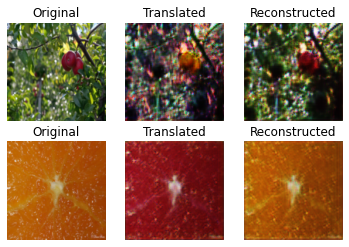

[Epoch 43/100] [Batch 11/15] [D loss: 0.248531, acc:  56%] [G loss: 3.486515, adv: 0.444551, recon: 0.111811, id: 0.198646] time: 0:49:30.303465 
[Epoch 43/100] [Batch 12/15] [D loss: 0.247052, acc:  57%] [G loss: 3.470447, adv: 0.435079, recon: 0.111399, id: 0.188483] time: 0:49:35.100230 
[Epoch 43/100] [Batch 13/15] [D loss: 0.259849, acc:  55%] [G loss: 3.494961, adv: 0.447745, recon: 0.112090, id: 0.178020] time: 0:49:39.888289 
[Epoch 44/100] [Batch 0/15] [D loss: 0.259838, acc:  55%] [G loss: 3.310652, adv: 0.414966, recon: 0.106053, id: 0.189468] time: 0:49:44.669028 


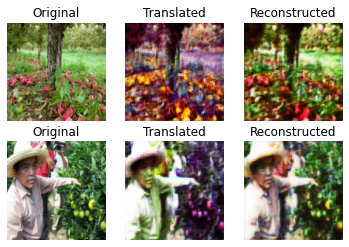

[Epoch 44/100] [Batch 1/15] [D loss: 0.242203, acc:  58%] [G loss: 3.265842, adv: 0.433613, recon: 0.103611, id: 0.163471] time: 0:49:49.937415 
[Epoch 44/100] [Batch 2/15] [D loss: 0.254174, acc:  55%] [G loss: 3.338994, adv: 0.433669, recon: 0.106001, id: 0.178241] time: 0:49:54.744169 
[Epoch 44/100] [Batch 3/15] [D loss: 0.258723, acc:  53%] [G loss: 3.479459, adv: 0.405067, recon: 0.115993, id: 0.180563] time: 0:49:59.550979 
[Epoch 44/100] [Batch 4/15] [D loss: 0.246350, acc:  56%] [G loss: 3.559923, adv: 0.445982, recon: 0.116622, id: 0.164814] time: 0:50:04.347638 
[Epoch 44/100] [Batch 5/15] [D loss: 0.250803, acc:  57%] [G loss: 3.689150, adv: 0.448824, recon: 0.121571, id: 0.186878] time: 0:50:09.145151 
[Epoch 44/100] [Batch 6/15] [D loss: 0.238405, acc:  59%] [G loss: 3.508102, adv: 0.464027, recon: 0.111775, id: 0.175536] time: 0:50:13.947737 
[Epoch 44/100] [Batch 7/15] [D loss: 0.276497, acc:  52%] [G loss: 3.737020, adv: 0.512465, recon: 0.117850, id: 0.180202] time: 0

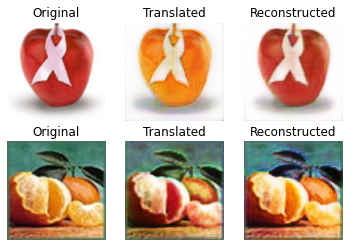

[Epoch 44/100] [Batch 11/15] [D loss: 0.253312, acc:  57%] [G loss: 3.508489, adv: 0.475195, recon: 0.108937, id: 0.194419] time: 0:50:38.644631 
[Epoch 44/100] [Batch 12/15] [D loss: 0.265056, acc:  54%] [G loss: 3.459650, adv: 0.434868, recon: 0.112345, id: 0.179572] time: 0:50:43.435201 
[Epoch 44/100] [Batch 13/15] [D loss: 0.262448, acc:  55%] [G loss: 3.387141, adv: 0.449945, recon: 0.107164, id: 0.167847] time: 0:50:48.220922 
[Epoch 45/100] [Batch 0/15] [D loss: 0.244643, acc:  59%] [G loss: 3.353786, adv: 0.483036, recon: 0.102288, id: 0.167180] time: 0:50:53.024138 


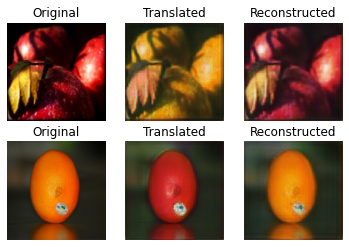

[Epoch 45/100] [Batch 1/15] [D loss: 0.270181, acc:  53%] [G loss: 3.288310, adv: 0.428810, recon: 0.104036, id: 0.174421] time: 0:50:58.280111 
[Epoch 45/100] [Batch 2/15] [D loss: 0.266834, acc:  53%] [G loss: 3.432786, adv: 0.439953, recon: 0.110298, id: 0.182742] time: 0:51:03.058999 
[Epoch 45/100] [Batch 3/15] [D loss: 0.247212, acc:  57%] [G loss: 3.343301, adv: 0.434627, recon: 0.106099, id: 0.179438] time: 0:51:07.834537 
[Epoch 45/100] [Batch 4/15] [D loss: 0.244028, acc:  58%] [G loss: 3.383584, adv: 0.436146, recon: 0.107526, id: 0.183931] time: 0:51:12.616903 
[Epoch 45/100] [Batch 5/15] [D loss: 0.254579, acc:  56%] [G loss: 3.573016, adv: 0.461544, recon: 0.114004, id: 0.189725] time: 0:51:17.374894 
[Epoch 45/100] [Batch 6/15] [D loss: 0.250755, acc:  58%] [G loss: 3.530981, adv: 0.435018, recon: 0.115498, id: 0.182734] time: 0:51:22.169724 
[Epoch 45/100] [Batch 7/15] [D loss: 0.254625, acc:  55%] [G loss: 3.525219, adv: 0.445199, recon: 0.113795, id: 0.178018] time: 0

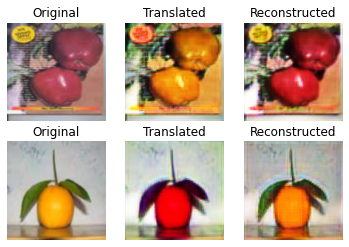

[Epoch 45/100] [Batch 11/15] [D loss: 0.249887, acc:  58%] [G loss: 3.505522, adv: 0.507027, recon: 0.107694, id: 0.166676] time: 0:51:46.516736 
[Epoch 45/100] [Batch 12/15] [D loss: 0.260978, acc:  57%] [G loss: 3.419935, adv: 0.433449, recon: 0.110633, id: 0.168413] time: 0:51:51.293311 
[Epoch 45/100] [Batch 13/15] [D loss: 0.252367, acc:  55%] [G loss: 3.277537, adv: 0.435848, recon: 0.103158, id: 0.176994] time: 0:51:56.106253 
[Epoch 46/100] [Batch 0/15] [D loss: 0.254131, acc:  55%] [G loss: 3.420421, adv: 0.445502, recon: 0.108418, id: 0.169417] time: 0:52:00.877754 


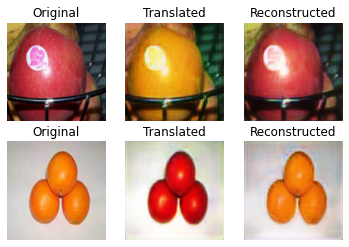

[Epoch 46/100] [Batch 1/15] [D loss: 0.262841, acc:  54%] [G loss: 3.426485, adv: 0.453472, recon: 0.109587, id: 0.174615] time: 0:52:06.149577 
[Epoch 46/100] [Batch 2/15] [D loss: 0.250634, acc:  58%] [G loss: 3.302611, adv: 0.443407, recon: 0.104261, id: 0.163678] time: 0:52:10.938108 
[Epoch 46/100] [Batch 3/15] [D loss: 0.252496, acc:  56%] [G loss: 3.543215, adv: 0.524346, recon: 0.106722, id: 0.193736] time: 0:52:15.750497 
[Epoch 46/100] [Batch 4/15] [D loss: 0.245363, acc:  58%] [G loss: 3.619529, adv: 0.478505, recon: 0.114811, id: 0.189427] time: 0:52:20.558092 
[Epoch 46/100] [Batch 5/15] [D loss: 0.271075, acc:  55%] [G loss: 3.858132, adv: 0.488384, recon: 0.126242, id: 0.193980] time: 0:52:25.335410 
[Epoch 46/100] [Batch 6/15] [D loss: 0.267783, acc:  55%] [G loss: 3.348392, adv: 0.424799, recon: 0.107502, id: 0.180504] time: 0:52:30.124311 
[Epoch 46/100] [Batch 7/15] [D loss: 0.257200, acc:  55%] [G loss: 3.403348, adv: 0.438679, recon: 0.108598, id: 0.177349] time: 0

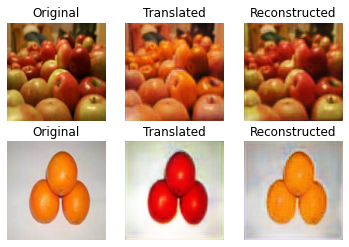

[Epoch 46/100] [Batch 11/15] [D loss: 0.262197, acc:  55%] [G loss: 3.246218, adv: 0.420145, recon: 0.103580, id: 0.156407] time: 0:52:54.526983 
[Epoch 46/100] [Batch 12/15] [D loss: 0.275506, acc:  49%] [G loss: 3.166228, adv: 0.393972, recon: 0.102445, id: 0.159439] time: 0:52:59.310987 
[Epoch 46/100] [Batch 13/15] [D loss: 0.254706, acc:  55%] [G loss: 3.337768, adv: 0.427817, recon: 0.107711, id: 0.162110] time: 0:53:04.090671 
[Epoch 47/100] [Batch 0/15] [D loss: 0.257118, acc:  54%] [G loss: 3.515070, adv: 0.413055, recon: 0.115917, id: 0.198171] time: 0:53:08.874668 


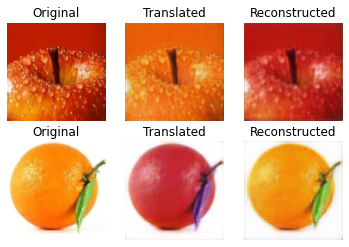

[Epoch 47/100] [Batch 1/15] [D loss: 0.245787, acc:  57%] [G loss: 3.355548, adv: 0.438161, recon: 0.107520, id: 0.155290] time: 0:53:14.134865 
[Epoch 47/100] [Batch 2/15] [D loss: 0.251207, acc:  57%] [G loss: 3.260517, adv: 0.434433, recon: 0.103391, id: 0.166101] time: 0:53:18.924477 
[Epoch 47/100] [Batch 3/15] [D loss: 0.257335, acc:  56%] [G loss: 3.363106, adv: 0.456541, recon: 0.105754, id: 0.163562] time: 0:53:23.698467 
[Epoch 47/100] [Batch 4/15] [D loss: 0.247966, acc:  56%] [G loss: 3.427002, adv: 0.454944, recon: 0.109178, id: 0.179775] time: 0:53:28.525762 
[Epoch 47/100] [Batch 5/15] [D loss: 0.244560, acc:  58%] [G loss: 3.471566, adv: 0.445900, recon: 0.111618, id: 0.168367] time: 0:53:33.316755 
[Epoch 47/100] [Batch 6/15] [D loss: 0.238440, acc:  59%] [G loss: 3.311697, adv: 0.446304, recon: 0.104075, id: 0.177353] time: 0:53:38.104095 
[Epoch 47/100] [Batch 7/15] [D loss: 0.254477, acc:  55%] [G loss: 3.418814, adv: 0.453872, recon: 0.108038, id: 0.170153] time: 0

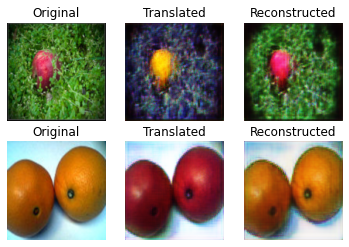

[Epoch 47/100] [Batch 11/15] [D loss: 0.261582, acc:  56%] [G loss: 3.155781, adv: 0.421310, recon: 0.098395, id: 0.179292] time: 0:54:02.594383 
[Epoch 47/100] [Batch 12/15] [D loss: 0.264393, acc:  53%] [G loss: 3.135501, adv: 0.414287, recon: 0.099558, id: 0.149040] time: 0:54:07.358402 
[Epoch 47/100] [Batch 13/15] [D loss: 0.288018, acc:  51%] [G loss: 3.406881, adv: 0.428748, recon: 0.109628, id: 0.184204] time: 0:54:12.109392 
[Epoch 48/100] [Batch 0/15] [D loss: 0.256202, acc:  55%] [G loss: 3.202778, adv: 0.425303, recon: 0.100891, id: 0.164920] time: 0:54:16.903550 


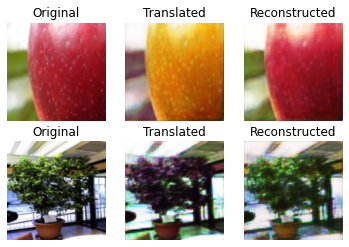

[Epoch 48/100] [Batch 1/15] [D loss: 0.255938, acc:  56%] [G loss: 3.429564, adv: 0.435961, recon: 0.111164, id: 0.173836] time: 0:54:22.151570 
[Epoch 48/100] [Batch 2/15] [D loss: 0.246366, acc:  56%] [G loss: 3.244477, adv: 0.452119, recon: 0.100450, id: 0.162221] time: 0:54:26.920507 
[Epoch 48/100] [Batch 3/15] [D loss: 0.268576, acc:  52%] [G loss: 3.293863, adv: 0.421451, recon: 0.106351, id: 0.151879] time: 0:54:31.664283 
[Epoch 48/100] [Batch 4/15] [D loss: 0.253263, acc:  57%] [G loss: 3.406657, adv: 0.438165, recon: 0.109862, id: 0.169569] time: 0:54:36.418012 
[Epoch 48/100] [Batch 5/15] [D loss: 0.254189, acc:  55%] [G loss: 3.260363, adv: 0.411014, recon: 0.105460, id: 0.173465] time: 0:54:41.204917 
[Epoch 48/100] [Batch 6/15] [D loss: 0.240117, acc:  59%] [G loss: 3.265947, adv: 0.447613, recon: 0.102404, id: 0.148756] time: 0:54:45.965372 
[Epoch 48/100] [Batch 7/15] [D loss: 0.248789, acc:  58%] [G loss: 3.445760, adv: 0.493028, recon: 0.104940, id: 0.192772] time: 0

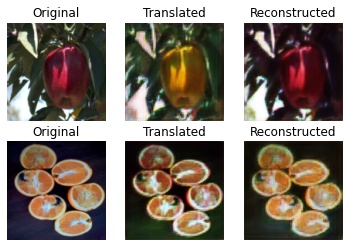

[Epoch 48/100] [Batch 11/15] [D loss: 0.259309, acc:  58%] [G loss: 3.518127, adv: 0.445273, recon: 0.113820, id: 0.168834] time: 0:55:10.465441 
[Epoch 48/100] [Batch 12/15] [D loss: 0.252923, acc:  55%] [G loss: 3.457710, adv: 0.440378, recon: 0.110359, id: 0.194258] time: 0:55:15.272312 
[Epoch 48/100] [Batch 13/15] [D loss: 0.242260, acc:  58%] [G loss: 3.313287, adv: 0.411300, recon: 0.107312, id: 0.176376] time: 0:55:20.043294 
[Epoch 49/100] [Batch 0/15] [D loss: 0.236955, acc:  59%] [G loss: 3.267806, adv: 0.436606, recon: 0.103417, id: 0.155093] time: 0:55:24.836738 


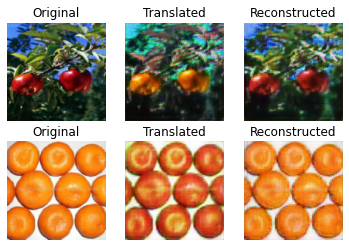

[Epoch 49/100] [Batch 1/15] [D loss: 0.245052, acc:  58%] [G loss: 3.173117, adv: 0.445845, recon: 0.098222, id: 0.155870] time: 0:55:30.079540 
[Epoch 49/100] [Batch 2/15] [D loss: 0.249252, acc:  58%] [G loss: 3.291465, adv: 0.454037, recon: 0.102144, id: 0.164124] time: 0:55:34.870422 
[Epoch 49/100] [Batch 3/15] [D loss: 0.240175, acc:  60%] [G loss: 3.411150, adv: 0.445560, recon: 0.109319, id: 0.163794] time: 0:55:39.655969 
[Epoch 49/100] [Batch 4/15] [D loss: 0.247772, acc:  57%] [G loss: 3.396867, adv: 0.430942, recon: 0.108746, id: 0.183474] time: 0:55:44.429696 
[Epoch 49/100] [Batch 5/15] [D loss: 0.247026, acc:  57%] [G loss: 3.128614, adv: 0.412481, recon: 0.099099, id: 0.154488] time: 0:55:49.189423 
[Epoch 49/100] [Batch 6/15] [D loss: 0.256121, acc:  54%] [G loss: 3.545357, adv: 0.428840, recon: 0.117256, id: 0.166903] time: 0:55:54.005792 
[Epoch 49/100] [Batch 7/15] [D loss: 0.259695, acc:  55%] [G loss: 3.599544, adv: 0.455147, recon: 0.116779, id: 0.185789] time: 0

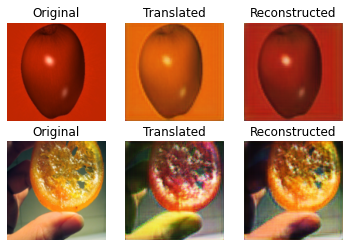

[Epoch 49/100] [Batch 11/15] [D loss: 0.249304, acc:  56%] [G loss: 3.467118, adv: 0.457351, recon: 0.110302, id: 0.174116] time: 0:56:18.485885 
[Epoch 49/100] [Batch 12/15] [D loss: 0.256364, acc:  57%] [G loss: 3.279828, adv: 0.442772, recon: 0.103442, id: 0.153165] time: 0:56:23.266154 
[Epoch 49/100] [Batch 13/15] [D loss: 0.263973, acc:  54%] [G loss: 3.242988, adv: 0.433454, recon: 0.102256, id: 0.165983] time: 0:56:28.057064 
[Epoch 50/100] [Batch 0/15] [D loss: 0.236123, acc:  61%] [G loss: 3.283494, adv: 0.445384, recon: 0.102906, id: 0.151197] time: 0:56:32.879435 


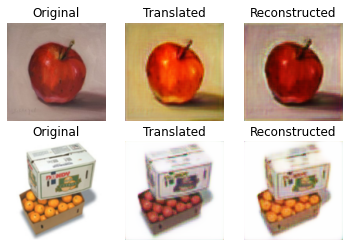

[Epoch 50/100] [Batch 1/15] [D loss: 0.257889, acc:  53%] [G loss: 3.253779, adv: 0.424916, recon: 0.103676, id: 0.164426] time: 0:56:38.112978 
[Epoch 50/100] [Batch 2/15] [D loss: 0.249299, acc:  57%] [G loss: 3.451207, adv: 0.445510, recon: 0.110043, id: 0.183603] time: 0:56:42.907675 
[Epoch 50/100] [Batch 3/15] [D loss: 0.238160, acc:  59%] [G loss: 3.381308, adv: 0.447494, recon: 0.105641, id: 0.190867] time: 0:56:47.690866 
[Epoch 50/100] [Batch 4/15] [D loss: 0.264767, acc:  52%] [G loss: 3.068822, adv: 0.405554, recon: 0.096949, id: 0.150688] time: 0:56:52.457770 
[Epoch 50/100] [Batch 5/15] [D loss: 0.249216, acc:  57%] [G loss: 3.392994, adv: 0.443776, recon: 0.108114, id: 0.174454] time: 0:56:57.238424 
[Epoch 50/100] [Batch 6/15] [D loss: 0.264304, acc:  54%] [G loss: 3.132427, adv: 0.402116, recon: 0.099999, id: 0.153737] time: 0:57:02.005319 
[Epoch 50/100] [Batch 7/15] [D loss: 0.248980, acc:  57%] [G loss: 3.227916, adv: 0.441939, recon: 0.100783, id: 0.166855] time: 0

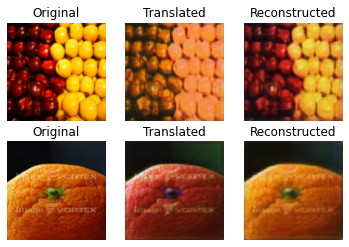

[Epoch 50/100] [Batch 11/15] [D loss: 0.248233, acc:  57%] [G loss: 3.378752, adv: 0.478434, recon: 0.103327, id: 0.184219] time: 0:57:26.611020 
[Epoch 50/100] [Batch 12/15] [D loss: 0.260398, acc:  56%] [G loss: 3.164899, adv: 0.440630, recon: 0.097625, id: 0.172776] time: 0:57:31.370349 
[Epoch 50/100] [Batch 13/15] [D loss: 0.261148, acc:  54%] [G loss: 3.199569, adv: 0.416339, recon: 0.101886, id: 0.151272] time: 0:57:36.150328 
[Epoch 51/100] [Batch 0/15] [D loss: 0.231905, acc:  62%] [G loss: 3.354327, adv: 0.438570, recon: 0.107973, id: 0.166748] time: 0:57:40.918108 


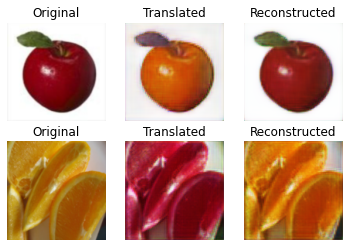

[Epoch 51/100] [Batch 1/15] [D loss: 0.264304, acc:  52%] [G loss: 3.353946, adv: 0.407438, recon: 0.110064, id: 0.155785] time: 0:57:46.171354 
[Epoch 51/100] [Batch 2/15] [D loss: 0.241452, acc:  59%] [G loss: 3.321116, adv: 0.430753, recon: 0.105985, id: 0.161755] time: 0:57:50.926652 
[Epoch 51/100] [Batch 3/15] [D loss: 0.252732, acc:  56%] [G loss: 3.218930, adv: 0.455391, recon: 0.098652, id: 0.167968] time: 0:57:55.720859 
[Epoch 51/100] [Batch 4/15] [D loss: 0.264540, acc:  54%] [G loss: 3.576522, adv: 0.445388, recon: 0.116634, id: 0.170235] time: 0:58:00.497471 
[Epoch 51/100] [Batch 5/15] [D loss: 0.235342, acc:  61%] [G loss: 3.666433, adv: 0.505970, recon: 0.116118, id: 0.162748] time: 0:58:05.332655 
[Epoch 51/100] [Batch 6/15] [D loss: 0.260891, acc:  56%] [G loss: 3.182034, adv: 0.442611, recon: 0.098038, id: 0.156282] time: 0:58:10.095315 
[Epoch 51/100] [Batch 7/15] [D loss: 0.245776, acc:  59%] [G loss: 3.213759, adv: 0.434018, recon: 0.101055, id: 0.159274] time: 0

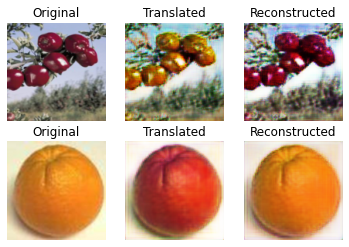

[Epoch 51/100] [Batch 11/15] [D loss: 0.262612, acc:  53%] [G loss: 3.215951, adv: 0.427337, recon: 0.100081, id: 0.179039] time: 0:58:34.479586 
[Epoch 51/100] [Batch 12/15] [D loss: 0.272386, acc:  52%] [G loss: 3.319045, adv: 0.404324, recon: 0.108591, id: 0.175274] time: 0:58:39.251180 
[Epoch 51/100] [Batch 13/15] [D loss: 0.257988, acc:  55%] [G loss: 3.043065, adv: 0.401177, recon: 0.095760, id: 0.165337] time: 0:58:44.042160 
[Epoch 52/100] [Batch 0/15] [D loss: 0.253313, acc:  56%] [G loss: 3.495960, adv: 0.448603, recon: 0.112842, id: 0.170673] time: 0:58:48.834648 


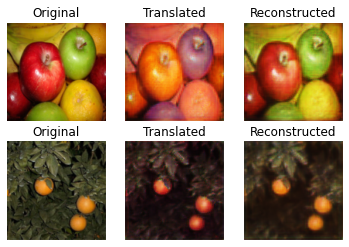

[Epoch 52/100] [Batch 1/15] [D loss: 0.261180, acc:  56%] [G loss: 3.384229, adv: 0.418531, recon: 0.110785, id: 0.148522] time: 0:58:54.086381 
[Epoch 52/100] [Batch 2/15] [D loss: 0.243579, acc:  57%] [G loss: 3.306342, adv: 0.421125, recon: 0.106758, id: 0.166585] time: 0:58:58.852444 
[Epoch 52/100] [Batch 3/15] [D loss: 0.242423, acc:  58%] [G loss: 3.337366, adv: 0.426477, recon: 0.108582, id: 0.140849] time: 0:59:03.624414 
[Epoch 52/100] [Batch 4/15] [D loss: 0.244037, acc:  60%] [G loss: 3.559360, adv: 0.446997, recon: 0.115876, id: 0.178923] time: 0:59:08.400385 
[Epoch 52/100] [Batch 5/15] [D loss: 0.249767, acc:  56%] [G loss: 3.197527, adv: 0.419245, recon: 0.102339, id: 0.151482] time: 0:59:13.208733 
[Epoch 52/100] [Batch 6/15] [D loss: 0.245950, acc:  57%] [G loss: 3.124216, adv: 0.435867, recon: 0.096119, id: 0.166495] time: 0:59:17.959359 
[Epoch 52/100] [Batch 7/15] [D loss: 0.240948, acc:  60%] [G loss: 3.250750, adv: 0.470104, recon: 0.098243, id: 0.172991] time: 0

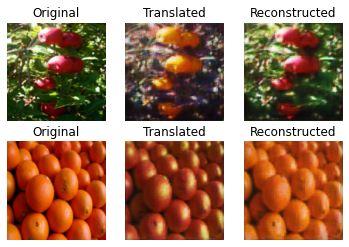

[Epoch 52/100] [Batch 11/15] [D loss: 0.250668, acc:  57%] [G loss: 3.227159, adv: 0.432797, recon: 0.100932, id: 0.166806] time: 0:59:42.389295 
[Epoch 52/100] [Batch 12/15] [D loss: 0.252746, acc:  55%] [G loss: 3.170577, adv: 0.414128, recon: 0.099954, id: 0.174708] time: 0:59:47.162548 
[Epoch 52/100] [Batch 13/15] [D loss: 0.246595, acc:  57%] [G loss: 3.185335, adv: 0.479591, recon: 0.094627, id: 0.153114] time: 0:59:51.966102 
[Epoch 53/100] [Batch 0/15] [D loss: 0.239457, acc:  61%] [G loss: 3.269633, adv: 0.433634, recon: 0.104024, id: 0.154546] time: 0:59:56.776538 


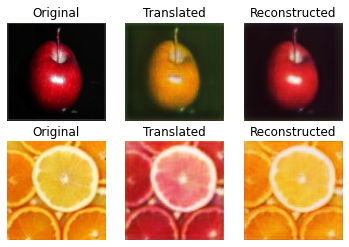

[Epoch 53/100] [Batch 1/15] [D loss: 0.262186, acc:  53%] [G loss: 3.408778, adv: 0.428142, recon: 0.111031, id: 0.150121] time: 1:00:02.045509 
[Epoch 53/100] [Batch 2/15] [D loss: 0.257667, acc:  55%] [G loss: 3.363242, adv: 0.440951, recon: 0.106952, id: 0.177415] time: 1:00:06.810290 
[Epoch 53/100] [Batch 3/15] [D loss: 0.255962, acc:  54%] [G loss: 3.199908, adv: 0.429150, recon: 0.100949, id: 0.157635] time: 1:00:11.598764 
[Epoch 53/100] [Batch 4/15] [D loss: 0.259794, acc:  56%] [G loss: 3.118925, adv: 0.453400, recon: 0.094166, id: 0.162256] time: 1:00:16.405506 
[Epoch 53/100] [Batch 5/15] [D loss: 0.250146, acc:  57%] [G loss: 3.200992, adv: 0.436760, recon: 0.099763, id: 0.152991] time: 1:00:21.194389 
[Epoch 53/100] [Batch 6/15] [D loss: 0.246624, acc:  56%] [G loss: 3.502349, adv: 0.425371, recon: 0.115598, id: 0.175726] time: 1:00:25.968338 
[Epoch 53/100] [Batch 7/15] [D loss: 0.239949, acc:  59%] [G loss: 3.210064, adv: 0.429797, recon: 0.100733, id: 0.171680] time: 1

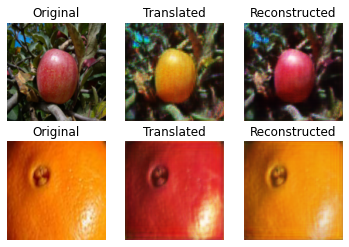

[Epoch 53/100] [Batch 11/15] [D loss: 0.272833, acc:  55%] [G loss: 3.252284, adv: 0.437778, recon: 0.102477, id: 0.166350] time: 1:00:50.359866 
[Epoch 53/100] [Batch 12/15] [D loss: 0.265343, acc:  55%] [G loss: 3.562472, adv: 0.478467, recon: 0.113181, id: 0.167015] time: 1:00:55.180407 
[Epoch 53/100] [Batch 13/15] [D loss: 0.268472, acc:  53%] [G loss: 3.835244, adv: 0.479925, recon: 0.127143, id: 0.167225] time: 1:00:59.980492 
[Epoch 54/100] [Batch 0/15] [D loss: 0.272178, acc:  54%] [G loss: 3.412605, adv: 0.449722, recon: 0.109740, id: 0.156482] time: 1:01:04.789459 


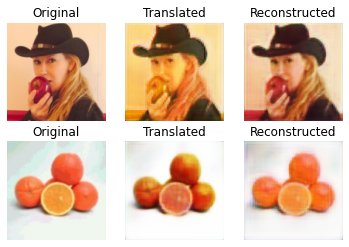

[Epoch 54/100] [Batch 1/15] [D loss: 0.256833, acc:  56%] [G loss: 3.290610, adv: 0.439713, recon: 0.104131, id: 0.148356] time: 1:01:10.046781 
[Epoch 54/100] [Batch 2/15] [D loss: 0.254185, acc:  59%] [G loss: 3.419461, adv: 0.475642, recon: 0.105672, id: 0.180485] time: 1:01:14.863076 
[Epoch 54/100] [Batch 3/15] [D loss: 0.264517, acc:  54%] [G loss: 3.313976, adv: 0.441986, recon: 0.105523, id: 0.154303] time: 1:01:19.629752 
[Epoch 54/100] [Batch 4/15] [D loss: 0.265879, acc:  54%] [G loss: 3.244027, adv: 0.483952, recon: 0.096633, id: 0.179668] time: 1:01:24.411310 
[Epoch 54/100] [Batch 5/15] [D loss: 0.280548, acc:  50%] [G loss: 3.450233, adv: 0.415109, recon: 0.113443, id: 0.178321] time: 1:01:29.208355 
[Epoch 54/100] [Batch 6/15] [D loss: 0.254941, acc:  55%] [G loss: 3.448250, adv: 0.448731, recon: 0.111020, id: 0.165378] time: 1:01:34.006690 
[Epoch 54/100] [Batch 7/15] [D loss: 0.251421, acc:  57%] [G loss: 3.268222, adv: 0.425042, recon: 0.104614, id: 0.159402] time: 1

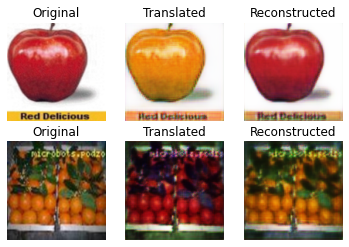

[Epoch 54/100] [Batch 11/15] [D loss: 0.246867, acc:  58%] [G loss: 3.261390, adv: 0.442885, recon: 0.102773, id: 0.159848] time: 1:01:58.368337 
[Epoch 54/100] [Batch 12/15] [D loss: 0.246058, acc:  60%] [G loss: 3.259547, adv: 0.460978, recon: 0.099652, id: 0.169696] time: 1:02:03.152826 
[Epoch 54/100] [Batch 13/15] [D loss: 0.255707, acc:  56%] [G loss: 3.392973, adv: 0.439284, recon: 0.109124, id: 0.169477] time: 1:02:07.950522 
[Epoch 55/100] [Batch 0/15] [D loss: 0.252872, acc:  57%] [G loss: 3.047594, adv: 0.434758, recon: 0.093764, id: 0.139118] time: 1:02:12.727056 


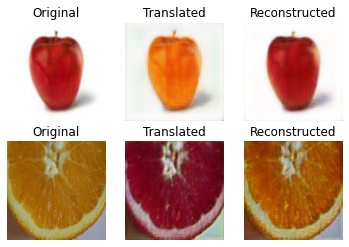

[Epoch 55/100] [Batch 1/15] [D loss: 0.254336, acc:  56%] [G loss: 3.278714, adv: 0.418071, recon: 0.104429, id: 0.187189] time: 1:02:17.990807 
[Epoch 55/100] [Batch 2/15] [D loss: 0.241203, acc:  58%] [G loss: 3.142777, adv: 0.419147, recon: 0.099188, id: 0.152883] time: 1:02:22.765579 
[Epoch 55/100] [Batch 3/15] [D loss: 0.269427, acc:  55%] [G loss: 3.441495, adv: 0.470939, recon: 0.108242, id: 0.172581] time: 1:02:27.574506 
[Epoch 55/100] [Batch 4/15] [D loss: 0.252495, acc:  57%] [G loss: 3.333785, adv: 0.443475, recon: 0.105646, id: 0.161175] time: 1:02:32.386660 
[Epoch 55/100] [Batch 5/15] [D loss: 0.251803, acc:  57%] [G loss: 3.274665, adv: 0.478159, recon: 0.100035, id: 0.151480] time: 1:02:37.175303 
[Epoch 55/100] [Batch 6/15] [D loss: 0.239202, acc:  60%] [G loss: 3.377085, adv: 0.455726, recon: 0.106793, id: 0.153390] time: 1:02:41.986496 
[Epoch 55/100] [Batch 7/15] [D loss: 0.249706, acc:  55%] [G loss: 3.232174, adv: 0.424034, recon: 0.103117, id: 0.154080] time: 1

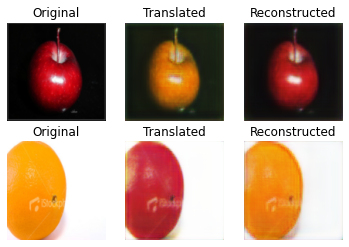

[Epoch 55/100] [Batch 11/15] [D loss: 0.229269, acc:  61%] [G loss: 3.308215, adv: 0.460468, recon: 0.102367, id: 0.163282] time: 1:03:06.403408 
[Epoch 55/100] [Batch 12/15] [D loss: 0.257105, acc:  55%] [G loss: 3.291656, adv: 0.456093, recon: 0.102924, id: 0.150410] time: 1:03:11.194464 
[Epoch 55/100] [Batch 13/15] [D loss: 0.274822, acc:  53%] [G loss: 3.330432, adv: 0.461984, recon: 0.104238, id: 0.166679] time: 1:03:16.002950 
[Epoch 56/100] [Batch 0/15] [D loss: 0.260263, acc:  56%] [G loss: 3.181652, adv: 0.449460, recon: 0.098105, id: 0.150428] time: 1:03:20.778437 


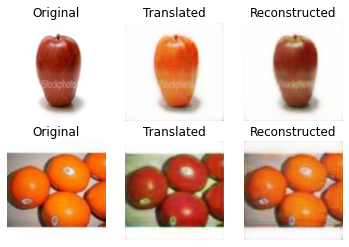

[Epoch 56/100] [Batch 1/15] [D loss: 0.256068, acc:  59%] [G loss: 3.157729, adv: 0.409036, recon: 0.100173, id: 0.164145] time: 1:03:25.984335 
[Epoch 56/100] [Batch 2/15] [D loss: 0.243956, acc:  58%] [G loss: 3.351238, adv: 0.438502, recon: 0.108202, id: 0.141912] time: 1:03:30.758123 
[Epoch 56/100] [Batch 3/15] [D loss: 0.251843, acc:  56%] [G loss: 3.195655, adv: 0.449510, recon: 0.098087, id: 0.169577] time: 1:03:35.534570 
[Epoch 56/100] [Batch 4/15] [D loss: 0.274180, acc:  52%] [G loss: 3.267048, adv: 0.410040, recon: 0.105723, id: 0.165727] time: 1:03:40.322656 
[Epoch 56/100] [Batch 5/15] [D loss: 0.255359, acc:  54%] [G loss: 3.372623, adv: 0.398004, recon: 0.112557, id: 0.151683] time: 1:03:45.092884 
[Epoch 56/100] [Batch 6/15] [D loss: 0.234372, acc:  60%] [G loss: 3.344262, adv: 0.438787, recon: 0.106212, id: 0.172949] time: 1:03:49.899867 
[Epoch 56/100] [Batch 7/15] [D loss: 0.246733, acc:  58%] [G loss: 3.100932, adv: 0.440841, recon: 0.093460, id: 0.175669] time: 1

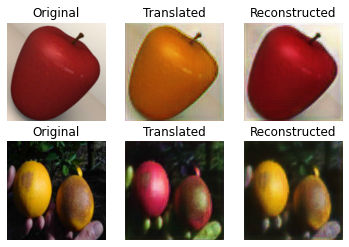

[Epoch 56/100] [Batch 11/15] [D loss: 0.243577, acc:  58%] [G loss: 3.066596, adv: 0.437860, recon: 0.094046, id: 0.154302] time: 1:04:14.548538 
[Epoch 56/100] [Batch 12/15] [D loss: 0.235929, acc:  59%] [G loss: 3.155482, adv: 0.451308, recon: 0.096226, id: 0.151360] time: 1:04:19.338547 
[Epoch 56/100] [Batch 13/15] [D loss: 0.250901, acc:  58%] [G loss: 3.278750, adv: 0.436903, recon: 0.103434, id: 0.155604] time: 1:04:24.121330 
[Epoch 57/100] [Batch 0/15] [D loss: 0.248078, acc:  57%] [G loss: 3.446465, adv: 0.432170, recon: 0.111392, id: 0.187325] time: 1:04:28.931244 


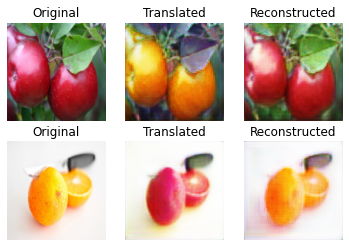

[Epoch 57/100] [Batch 1/15] [D loss: 0.260742, acc:  55%] [G loss: 3.308295, adv: 0.432466, recon: 0.105077, id: 0.168128] time: 1:04:34.200411 
[Epoch 57/100] [Batch 2/15] [D loss: 0.246770, acc:  58%] [G loss: 3.280478, adv: 0.447477, recon: 0.103359, id: 0.159143] time: 1:04:39.001451 
[Epoch 57/100] [Batch 3/15] [D loss: 0.245623, acc:  57%] [G loss: 3.176688, adv: 0.431963, recon: 0.099644, id: 0.155291] time: 1:04:43.788387 
[Epoch 57/100] [Batch 4/15] [D loss: 0.247747, acc:  57%] [G loss: 3.085362, adv: 0.419368, recon: 0.096050, id: 0.158344] time: 1:04:48.564732 
[Epoch 57/100] [Batch 5/15] [D loss: 0.244128, acc:  60%] [G loss: 3.370534, adv: 0.508969, recon: 0.101336, id: 0.148116] time: 1:04:53.344104 
[Epoch 57/100] [Batch 6/15] [D loss: 0.267041, acc:  53%] [G loss: 3.088554, adv: 0.415960, recon: 0.097473, id: 0.138636] time: 1:04:58.157361 
[Epoch 57/100] [Batch 7/15] [D loss: 0.246085, acc:  58%] [G loss: 3.050868, adv: 0.438200, recon: 0.093174, id: 0.157186] time: 1

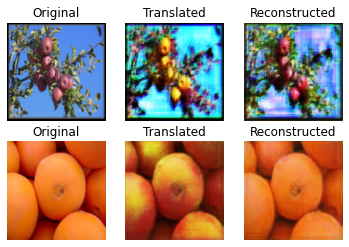

[Epoch 57/100] [Batch 11/15] [D loss: 0.256318, acc:  57%] [G loss: 3.434395, adv: 0.480693, recon: 0.106134, id: 0.182135] time: 1:05:22.582747 
[Epoch 57/100] [Batch 12/15] [D loss: 0.262556, acc:  55%] [G loss: 3.150539, adv: 0.441278, recon: 0.097363, id: 0.161099] time: 1:05:27.357858 
[Epoch 57/100] [Batch 13/15] [D loss: 0.258845, acc:  55%] [G loss: 3.391003, adv: 0.428413, recon: 0.110287, id: 0.151386] time: 1:05:32.145601 
[Epoch 58/100] [Batch 0/15] [D loss: 0.266136, acc:  52%] [G loss: 3.318570, adv: 0.454804, recon: 0.105233, id: 0.147369] time: 1:05:36.947818 


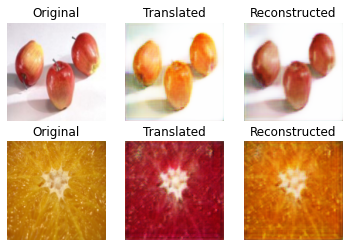

[Epoch 58/100] [Batch 1/15] [D loss: 0.250765, acc:  58%] [G loss: 3.138982, adv: 0.435258, recon: 0.097673, id: 0.147777] time: 1:05:42.222682 
[Epoch 58/100] [Batch 2/15] [D loss: 0.243782, acc:  58%] [G loss: 3.231655, adv: 0.440612, recon: 0.101517, id: 0.147593] time: 1:05:47.027361 
[Epoch 58/100] [Batch 3/15] [D loss: 0.247456, acc:  56%] [G loss: 3.475977, adv: 0.445720, recon: 0.112238, id: 0.175666] time: 1:05:51.806423 
[Epoch 58/100] [Batch 4/15] [D loss: 0.259443, acc:  53%] [G loss: 3.078506, adv: 0.422376, recon: 0.095938, id: 0.152952] time: 1:05:56.618222 
[Epoch 58/100] [Batch 5/15] [D loss: 0.244936, acc:  58%] [G loss: 3.213442, adv: 0.448101, recon: 0.099516, id: 0.148103] time: 1:06:01.375708 
[Epoch 58/100] [Batch 6/15] [D loss: 0.254198, acc:  59%] [G loss: 3.292179, adv: 0.461956, recon: 0.101978, id: 0.151331] time: 1:06:06.175336 
[Epoch 58/100] [Batch 7/15] [D loss: 0.240576, acc:  61%] [G loss: 3.431746, adv: 0.439961, recon: 0.110044, id: 0.170814] time: 1

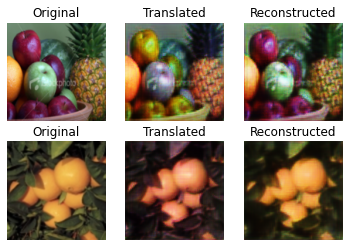

[Epoch 58/100] [Batch 11/15] [D loss: 0.270108, acc:  54%] [G loss: 3.184500, adv: 0.414914, recon: 0.101275, id: 0.167550] time: 1:06:30.643966 
[Epoch 58/100] [Batch 12/15] [D loss: 0.253580, acc:  56%] [G loss: 3.268874, adv: 0.444402, recon: 0.102783, id: 0.147113] time: 1:06:35.426268 
[Epoch 58/100] [Batch 13/15] [D loss: 0.257092, acc:  56%] [G loss: 3.173623, adv: 0.423859, recon: 0.100568, id: 0.155121] time: 1:06:40.223543 
[Epoch 59/100] [Batch 0/15] [D loss: 0.240787, acc:  60%] [G loss: 3.275697, adv: 0.441096, recon: 0.103036, id: 0.163564] time: 1:06:45.019356 


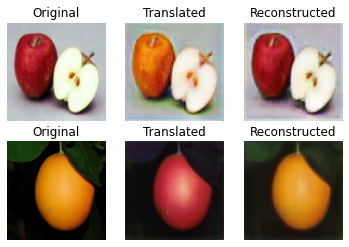

[Epoch 59/100] [Batch 1/15] [D loss: 0.246300, acc:  57%] [G loss: 3.126811, adv: 0.432934, recon: 0.096229, id: 0.170074] time: 1:06:50.301394 
[Epoch 59/100] [Batch 2/15] [D loss: 0.242563, acc:  57%] [G loss: 3.024919, adv: 0.423901, recon: 0.092980, id: 0.164601] time: 1:06:55.058134 
[Epoch 59/100] [Batch 3/15] [D loss: 0.255752, acc:  54%] [G loss: 3.110889, adv: 0.423175, recon: 0.097674, id: 0.147150] time: 1:06:59.851786 
[Epoch 59/100] [Batch 4/15] [D loss: 0.244498, acc:  59%] [G loss: 3.131404, adv: 0.448816, recon: 0.096044, id: 0.154664] time: 1:07:04.625867 
[Epoch 59/100] [Batch 5/15] [D loss: 0.256737, acc:  55%] [G loss: 3.104282, adv: 0.425628, recon: 0.096520, id: 0.143621] time: 1:07:09.427241 
[Epoch 59/100] [Batch 6/15] [D loss: 0.238641, acc:  59%] [G loss: 3.350898, adv: 0.445060, recon: 0.106262, id: 0.179048] time: 1:07:14.237663 
[Epoch 59/100] [Batch 7/15] [D loss: 0.258836, acc:  55%] [G loss: 3.138232, adv: 0.415349, recon: 0.099360, id: 0.160462] time: 1

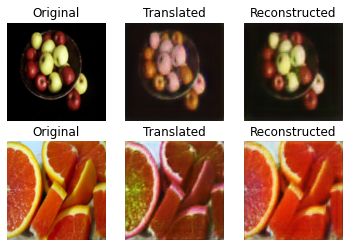

[Epoch 59/100] [Batch 11/15] [D loss: 0.288589, acc:  50%] [G loss: 3.552222, adv: 0.466872, recon: 0.115000, id: 0.145977] time: 1:07:38.730132 
[Epoch 59/100] [Batch 12/15] [D loss: 0.262125, acc:  56%] [G loss: 3.534472, adv: 0.457198, recon: 0.114052, id: 0.165947] time: 1:07:43.512077 
[Epoch 59/100] [Batch 13/15] [D loss: 0.262093, acc:  56%] [G loss: 3.318096, adv: 0.465087, recon: 0.102788, id: 0.170610] time: 1:07:48.290372 
[Epoch 60/100] [Batch 0/15] [D loss: 0.243766, acc:  58%] [G loss: 3.269746, adv: 0.442180, recon: 0.103067, id: 0.163562] time: 1:07:53.074385 


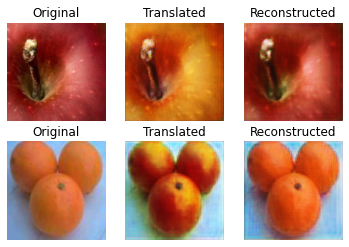

[Epoch 60/100] [Batch 1/15] [D loss: 0.253856, acc:  57%] [G loss: 3.154428, adv: 0.431495, recon: 0.097976, id: 0.165546] time: 1:07:58.364379 
[Epoch 60/100] [Batch 2/15] [D loss: 0.259439, acc:  53%] [G loss: 3.238681, adv: 0.417723, recon: 0.103665, id: 0.164504] time: 1:08:03.188221 
[Epoch 60/100] [Batch 3/15] [D loss: 0.265412, acc:  54%] [G loss: 2.963720, adv: 0.402178, recon: 0.092215, id: 0.147086] time: 1:08:07.961572 
[Epoch 60/100] [Batch 4/15] [D loss: 0.239537, acc:  58%] [G loss: 3.085064, adv: 0.436082, recon: 0.094381, id: 0.167161] time: 1:08:12.758811 
[Epoch 60/100] [Batch 5/15] [D loss: 0.242065, acc:  59%] [G loss: 3.281844, adv: 0.441997, recon: 0.103257, id: 0.158086] time: 1:08:17.542838 
[Epoch 60/100] [Batch 6/15] [D loss: 0.241117, acc:  59%] [G loss: 3.205153, adv: 0.453032, recon: 0.099585, id: 0.151889] time: 1:08:22.366320 
[Epoch 60/100] [Batch 7/15] [D loss: 0.263958, acc:  51%] [G loss: 3.061083, adv: 0.421919, recon: 0.095436, id: 0.148534] time: 1

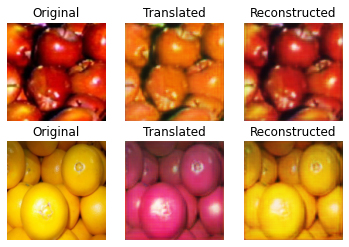

[Epoch 60/100] [Batch 11/15] [D loss: 0.259028, acc:  55%] [G loss: 3.034615, adv: 0.433072, recon: 0.092315, id: 0.159255] time: 1:08:46.912049 
[Epoch 60/100] [Batch 12/15] [D loss: 0.267676, acc:  53%] [G loss: 2.860386, adv: 0.401170, recon: 0.087708, id: 0.150996] time: 1:08:51.720605 
[Epoch 60/100] [Batch 13/15] [D loss: 0.247313, acc:  59%] [G loss: 3.077190, adv: 0.420937, recon: 0.095245, id: 0.164615] time: 1:08:56.524142 
[Epoch 61/100] [Batch 0/15] [D loss: 0.239610, acc:  57%] [G loss: 3.014938, adv: 0.424660, recon: 0.092213, id: 0.141127] time: 1:09:01.334809 


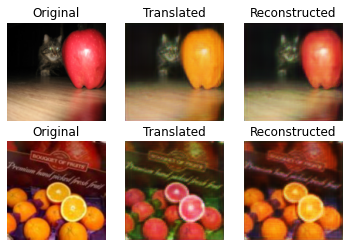

[Epoch 61/100] [Batch 1/15] [D loss: 0.237713, acc:  59%] [G loss: 3.137015, adv: 0.437242, recon: 0.096720, id: 0.162084] time: 1:09:06.674821 
[Epoch 61/100] [Batch 2/15] [D loss: 0.269551, acc:  50%] [G loss: 3.123961, adv: 0.400112, recon: 0.100883, id: 0.145451] time: 1:09:11.484447 
[Epoch 61/100] [Batch 3/15] [D loss: 0.240466, acc:  61%] [G loss: 3.337761, adv: 0.438303, recon: 0.106880, id: 0.162894] time: 1:09:16.296795 
[Epoch 61/100] [Batch 4/15] [D loss: 0.237870, acc:  59%] [G loss: 3.030911, adv: 0.435960, recon: 0.092751, id: 0.151133] time: 1:09:21.090694 
[Epoch 61/100] [Batch 5/15] [D loss: 0.247845, acc:  56%] [G loss: 3.200248, adv: 0.453101, recon: 0.099604, id: 0.147285] time: 1:09:25.896504 


In [ ]:

gan.train(epochs=100, batch_size=64, sample_interval=10)
# gan.train(epochs=20, batch_size=64, sample_interval=5)

## Now we can look at the results!

You may have three observations:
1. The progress can be slow—even on the Colab GPU or on CPU.
2. The initial images can be quite bad and make no sense at all, but worry not—soon enough, the images will manage at least a decent reconstruction.
3. The later reconstructions are generally mixed: some look very convincing—such as the ones below—but some are merely an orange "repainting" of the apples and vice versa. Even the original authors of the paper mention this problem: CycleGAN is unable to substantially change the structure of the image, but only "restylize" it. So beware of this limitation.

![Good examples](https://i.ibb.co/n00BW1F/163-10.png)

Also, this is a good introduction to the reality of being a GAN researcher / practitioner. Most flashy results still tend to be cherry picked and most papers—e.g. [BigGAN being a notable exception](https://arxiv.org/abs/1809.11096)—do not share failure cases. BigGAN—the state of the art as of today (20/11/2018)—even [publishes Google folders worth of examples](https://drive.google.com/drive/folders/1SRYj8Ou1JZ4e09LqeawDHcUvoeY78tPO). 